# IQA Comparative Analysis: Visualization Notebook

This notebook provides comprehensive and easy-to-understand visualizations of the results generated by the IQA Comparative Analysis. The goal is to help you quickly interpret which image quality assessment (IQA) metrics are most effective for different types of data and datasets. All visualizations and result summaries are presented here for clarity and convenience. No extra files will be created; all outputs are shown in this notebook.

In [3]:
# Import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
from statsmodels.distributions.empirical_distribution import ECDF
%matplotlib inline

## Section 1: Data Loading

We load the results generated by the analysis notebook. These include:
- BAPPS_Evaluation_Results.csv: Metric preferences and agreement with human judgments (BAPPS dataset)
- LIVE_MD_Evaluation_Results.csv: Metric scores and correlation with MOS (LIVE-MD dataset)
- IQA_Performance_Summary.csv: Combined performance summary across datasets
- custom_dataset_iqa_results.csv: Results for custom datasets (if available)

In [4]:
# Define file paths (case-insensitive search for custom dataset results)
bapps_path = "BAPPS_Evaluation_Results_with_Time.csv"
live_md_path = "LIVE_MD_Evaluation_Results_with_Time.csv"
custom_path = "custom_dataset_iqa_results_with_Time.csv"
perf_summary_path = "IQA_Performance_Summary.csv"

# Load data
bapps_df = pd.read_csv(bapps_path) if os.path.exists(bapps_path) else None
live_md_df = pd.read_csv(live_md_path) if os.path.exists(live_md_path) else None
custom_df = pd.read_csv(custom_path) if os.path.exists(custom_path) else None
perf_df = pd.read_csv(perf_summary_path) if os.path.exists(perf_summary_path) else None

# Show a preview of each
def show_preview(df, name):
    if df is not None:
        print(f"\nPreview of {name}:")
        display(df.head())
show_preview(bapps_df, bapps_path)
show_preview(live_md_df, live_md_path)
show_preview(custom_df, custom_path)
show_preview(perf_df, perf_summary_path)


Preview of BAPPS_Evaluation_Results_with_Time.csv:


,sample_id,human_judgment,ref_path,p0_path,p1_path,ssim_p0_score,ssim_p0_time,ssim_p1_score,ssim_p1_time,ssim_prefers_p0,...,lpips_vgg_p0_score,lpips_vgg_p0_time,lpips_vgg_p1_score,lpips_vgg_p1_time,lpips_vgg_prefers_p0,lpips_squeeze_p0_score,lpips_squeeze_p0_time,lpips_squeeze_p1_score,lpips_squeeze_p1_time,lpips_squeeze_prefers_p0
0,0,0.0,BAPPS/dataset/2afc/train/cnn/ref/000000.png,BAPPS/dataset/2afc/train/cnn/p0/000000.png,BAPPS/dataset/2afc/train/cnn/p1/000000.png,0.720137,0.046119,0.587537,0.032128,True,...,0.528472,0.312571,0.625071,0.312876,False,0.300675,0.024951,0.595492,0.025490,False
1,1,0.0,BAPPS/dataset/2afc/train/cnn/ref/000001.png,BAPPS/dataset/2afc/train/cnn/p0/000001.png,BAPPS/dataset/2afc/train/cnn/p1/000001.png,0.880114,0.033989,0.918714,0.032076,False,...,0.475765,0.325319,0.430234,0.530206,True,0.354997,0.026145,0.326799,0.025693,True
2,2,0.0,BAPPS/dataset/2afc/train/cnn/ref/000002.png,BAPPS/dataset/2afc/train/cnn/p0/000002.png,BAPPS/dataset/2afc/train/cnn/p1/000002.png,0.858076,0.034001,0.652461,0.032331,True,...,0.213196,0.346768,0.406427,0.347545,False,0.130609,0.025245,0.411897,0.025427,False
3,3,0.5,BAPPS/dataset/2afc/train/cnn/ref/000003.png,BAPPS/dataset/2afc/train/cnn/p0/000003.png,BAPPS/dataset/2afc/train/cnn/p1/000003.png,0.796550,0.035461,0.647121,0.032921,True,...,0.844380,0.322853,0.502503,0.338343,True,0.609024,0.024980,0.316218,0.027241,True
4,4,0.0,BAPPS/dataset/2afc/train/cnn/ref/000004.png,BAPPS/dataset/2afc/train/cnn/p0/000004.png,BAPPS/dataset/2afc/train/cnn/p1/000004.png,0.868618,0.035226,0.520730,0.032132,True,...,0.241310,0.315160,0.556476,0.328768,False,0.130173,0.023491,0.515337,0.031359,False



Preview of LIVE_MD_Evaluation_Results_with_Time.csv:


,sample_id,ref_path,dis_path,mos,distortion_type,ssim_score,ssim_time,ms_ssim_score,ms_ssim_time,uiqi_score,...,brisque_score,brisque_time,niqe_score,niqe_time,clipiqa_score,clipiqa_time,blinds2_score,blinds2_time,pique_score,pique_time
0,0,LIVE_MD/To_Release/Ref_Images/babygirl.bmp,LIVE_MD/To_Release/Part_1/blurjpeg/babygirl_bl...,21.5789,Multiply Dist.,0.985606,0.033858,0.997741,0.040908,NaN,...,0.893664,0.026599,0.953520,0.061412,0.629732,2.634122,0.050638,0.005420,0.127877,0.002879
1,1,LIVE_MD/To_Release/Ref_Images/babygirl.bmp,LIVE_MD/To_Release/Part_1/blurjpeg/babygirl_bl...,35.7895,Multiply Dist.,0.976596,0.035153,0.996457,0.043951,NaN,...,0.892323,0.019896,0.957398,0.021784,0.603754,2.100206,0.050642,0.002081,0.127761,0.002947
2,2,LIVE_MD/To_Release/Ref_Images/babygirl.bmp,LIVE_MD/To_Release/Part_1/blurjpeg/babygirl_bl...,32.6316,Multiply Dist.,0.970972,0.035692,0.995572,0.041943,NaN,...,0.881633,0.021313,0.957959,0.023782,0.531462,2.332748,0.050624,0.002449,0.127922,0.002888
3,3,LIVE_MD/To_Release/Ref_Images/babygirl.bmp,LIVE_MD/To_Release/Part_1/blurjpeg/babygirl_bl...,54.3158,Multiply Dist.,0.961232,0.037605,0.993969,0.042840,NaN,...,0.863944,0.021883,0.956548,0.018515,0.542955,2.247245,0.050722,0.002374,0.127676,0.002903
4,4,LIVE_MD/To_Release/Ref_Images/babygirl.bmp,LIVE_MD/To_Release/Part_1/blurjpeg/babygirl_bl...,40.0000,Multiply Dist.,0.963532,0.034151,0.994665,0.043359,NaN,...,0.816047,0.019134,0.942674,0.021802,0.487815,2.101584,0.050869,0.002204,0.120693,0.002877



Preview of custom_dataset_iqa_results_with_Time.csv:


,dataset,original_image,distortion_type,distortion_level,distorted_image_path,metric,score,time,metric_type
0,generated,0002.jpg,original,0.0,./images/generated/0002.jpg,brisque,0.910057,0.141564,NR
1,generated,0002.jpg,original,0.0,./images/generated/0002.jpg,niqe,0.887375,0.040107,NR
2,generated,0002.jpg,original,0.0,./images/generated/0002.jpg,clipiqa,0.757074,2.622122,NR
3,generated,0002.jpg,original,0.0,./images/generated/0002.jpg,blinds2,0.064719,0.012880,NR
4,generated,0002.jpg,original,0.0,./images/generated/0002.jpg,pique,0.147902,0.003460,NR



Preview of IQA_Performance_Summary.csv:


,Metric,BAPPS_Agreement,LIVE_MD_Pearson_Abs,LIVE_MD_Spearman_Abs,Avg_Computation_Time_s,Category,Type,Overall_Performance_Score
0,rmse,0.9500,NaN,NaN,0.000102,signal,full_reference,0.47500
1,psnr,0.9500,NaN,NaN,0.000764,signal,full_reference,0.47500
2,mse,0.9500,NaN,NaN,0.000137,signal,full_reference,0.47500
3,vsi,0.9500,NaN,NaN,0.057009,feature,full_reference,0.47500
4,mae,0.9375,NaN,NaN,0.000328,signal,full_reference,0.46875


## Section 2: Metric Agreement with Human Judgments (BAPPS)

This section visualizes how well each metric agrees with human judgments on the BAPPS dataset. High agreement indicates the metric aligns well with human perception.

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3741762216.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(agreement_rates.keys()), y=list(agreement_rates.values()), palette='viridis')


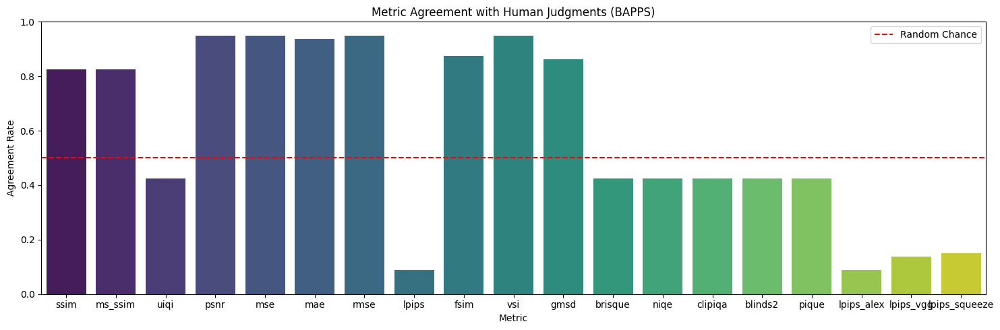

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3741762216.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(sorted_agreement.values()), y=list(sorted_agreement.keys()), palette='mako')


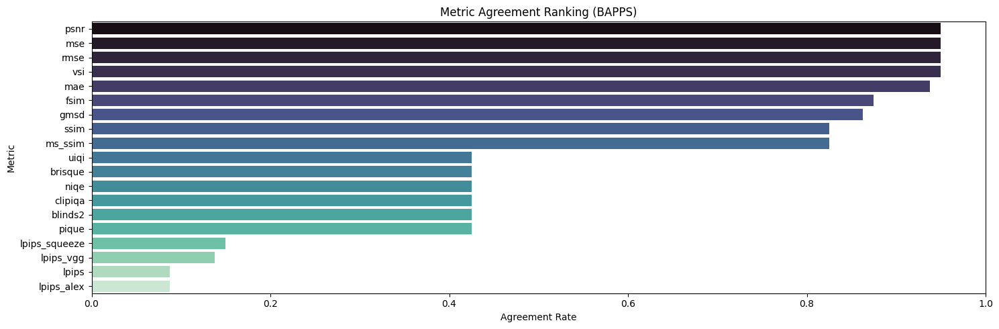

In [35]:
# Visualize BAPPS metric agreement with human judgments (bar, horizontal bar, and ranking)
if bapps_df is not None:
    pref_cols = [col for col in bapps_df.columns if col.endswith('_prefers_p0')]
    if 'human_judgment' in bapps_df.columns and pref_cols:
        clear_prefs = bapps_df[bapps_df['human_judgment'] != 0.5]
        human_prefers_p0 = clear_prefs['human_judgment'] < 0.5
        agreement_rates = {} 
        for col in pref_cols:  
            metric = col.replace('_prefers_p0', '')
            metric_prefers_p0 = clear_prefs[col]
            if metric_prefers_p0.notna().sum() > 0:
                agreements = metric_prefers_p0 == human_prefers_p0
                agreement_rates[metric] = agreements.mean()
        # Bar plot
        plt.figure(figsize=(15, 5))
        sns.barplot(x=list(agreement_rates.keys()), y=list(agreement_rates.values()), palette='viridis')
        plt.title('Metric Agreement with Human Judgments (BAPPS)')
        plt.ylabel('Agreement Rate')
        plt.xlabel('Metric')
        plt.ylim(0, 1)
        plt.axhline(0.5, color='red', linestyle='--', label='Random Chance')
        plt.legend()
        plt.tight_layout()
        plt.show()
        # Horizontal bar plot (ranking)
        sorted_agreement = dict(sorted(agreement_rates.items(), key=lambda x: x[1], reverse=True))
        plt.figure(figsize=(15, 5))
        sns.barplot(x=list(sorted_agreement.values()), y=list(sorted_agreement.keys()), palette='mako')
        plt.title('Metric Agreement Ranking (BAPPS)')
        plt.xlabel('Agreement Rate')
        plt.ylabel('Metric')
        plt.xlim(0, 1)
        plt.tight_layout()
        plt.show()


    

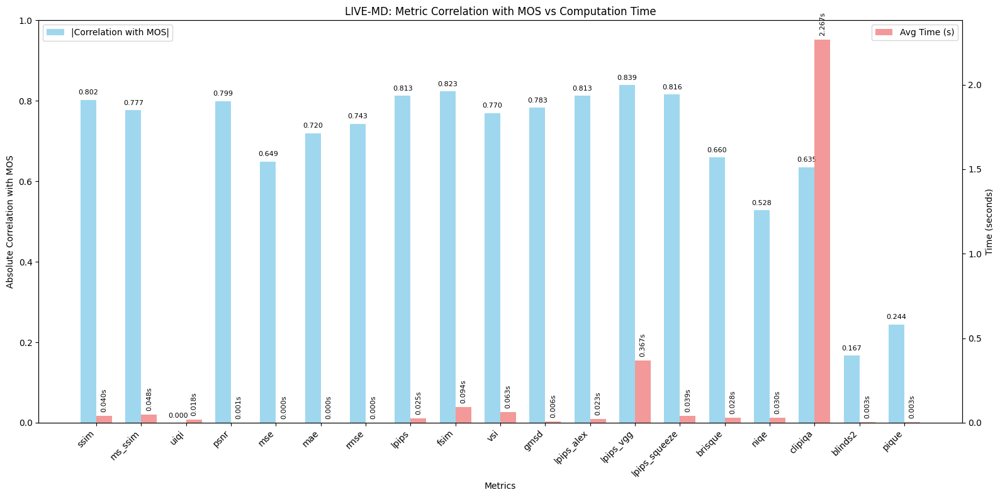

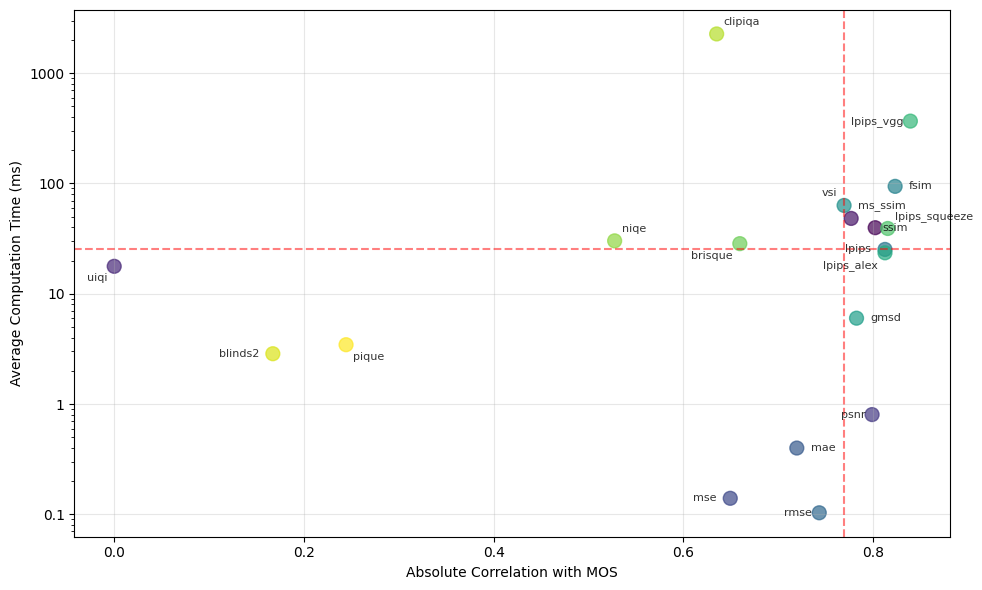

In [35]:
from matplotlib.ticker import FuncFormatter
import random
# Visualize LIVE MD metric performance with MOS comparison and timing
if live_md_df is not None:
    score_cols = [col for col in live_md_df.columns if col.endswith('_score')]
    time_cols = [col for col in live_md_df.columns if col.endswith('_time')]
    
    if score_cols and time_cols and 'mos' in live_md_df.columns:
        # Calculate correlations with MOS for each metric
        correlations = []
        for score_col in score_cols:
            valid_data = live_md_df[[score_col, 'mos']].dropna()
            if len(valid_data) > 5:
                corr = valid_data[score_col].corr(valid_data['mos'], method='pearson')
                if not np.isnan(corr):
                    correlations.append(abs(corr))  # Use absolute correlation
                else:
                    correlations.append(0)
            else:
                correlations.append(0)
        
        # Calculate mean computation times
        metric_times = live_md_df[time_cols].mean()
        
        # Extract metric names
        metrics = [col.replace('_score', '') for col in score_cols]
        time_values = [metric_times[time_col] for time_col in time_cols]
        
        # Create the plot
        x = np.arange(len(metrics))
        width = 0.35
        
        fig, ax1 = plt.subplots(figsize=(16, 8))
        
        # First y-axis for correlation with MOS
        bars1 = ax1.bar(x - width/2, correlations, width, label='|Correlation with MOS|', 
                       color='skyblue', alpha=0.8)
        
        # Second y-axis for computation time
        ax2 = ax1.twinx()
        bars2 = ax2.bar(x + width/2, time_values, width, label='Avg Time (s)', 
                       color='lightcoral', alpha=0.8)
        
        # Formatting
        ax1.set_xlabel('Metrics')
        ax1.set_ylabel('Absolute Correlation with MOS')
        ax2.set_ylabel('Time (seconds)')
        ax1.set_title('LIVE-MD: Metric Correlation with MOS vs Computation Time')
        ax1.set_xticks(x)
        ax1.set_xticklabels(metrics, rotation=45, ha='right')
        ax1.set_ylim(0, 1)  # Correlation ranges from 0 to 1
        
        # Add value labels on bars
        for i, (corr, time_val) in enumerate(zip(correlations, time_values)):
            ax1.text(i - width/2, corr + 0.01, f'{corr:.3f}', ha='center', va='bottom', fontsize=8)
            ax2.text(i + width/2, time_val + max(time_values)*0.01, f'{time_val:.3f}s', 
                    ha='center', va='bottom', fontsize=8, rotation=90)
        
        # Legends
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        
        plt.tight_layout()
        plt.show()
        
        # Additional plot: Scatter plot of correlation vs time (with logarithmic y-axis)
        plt.figure(figsize=(10, 6))
        time_values_ms = [t * 1000 for t in time_values]  # Convert to milliseconds
        scatter = plt.scatter(correlations, time_values_ms, s=100, alpha=0.7, c=range(len(metrics)), cmap='viridis')
                
        # Add metric labels to points with varied positioning

        label_positions = ['left', 'right', 'center left', 'center right', 
                          'bottom left', 'bottom right', 'top left', 'top right']

        for i, metric in enumerate(metrics):
            # Randomly choose label position
            pos = random.choice(label_positions)
            
            # Set offset based on position
            if 'left' in pos:
                offset_x = -5 if 'center' not in pos else -10
                ha = 'right'
            elif 'right' in pos:
                offset_x = 5 if 'center' not in pos else 10
                ha = 'left'
            else:
                offset_x = 0
                ha = 'center'
            
            if 'top' in pos:
                offset_y = 5
                va = 'bottom'
            elif 'bottom' in pos:
                offset_y = -5
                va = 'top'
            else:
                offset_y = 0
                va = 'center'
            
            plt.annotate(metric, 
                         (correlations[i], time_values_ms[i]), 
                         xytext=(offset_x, offset_y), textcoords='offset points', 
                         fontsize=8, ha=ha, va=va, alpha=0.8)
            # # Add metric labels to points
            # for i, metric in enumerate(metrics):
            #     plt.annotate(metric, (correlations[i], time_values_ms[i]), 
            #     xytext=(5, 5), textcoords='offset points', fontsize=9)
        
        plt.xlabel('Absolute Correlation with MOS')
        plt.ylabel('Average Computation Time (ms)')
        plt.yscale('log')  # Set y-axis to logarithmic scale
        # plt.title('LIVE-MD: Correlation vs Computation Time Trade-off (Log Scale)')
        plt.grid(True, alpha=0.3)
        
        # Add quadrant labels (using log scale for median)
        plt.axhline(np.median(time_values_ms), color='red', linestyle='--', alpha=0.5)
        plt.axvline(np.median(correlations), color='red', linestyle='--', alpha=0.5)
        
        # Format y-axis to show actual millisecond values instead of powers of 10
        def ms_formatter(x, pos):
            if x < 1:
                return f'{x:.1f}'
            elif x < 10:
                return f'{x:.0f}'
            elif x < 100:
                return f'{x:.0f}'
            else:
                return f'{x:.0f}'
        
        plt.gca().yaxis.set_major_formatter(FuncFormatter(ms_formatter))
        
        plt.tight_layout()
        plt.show()


## Section 3: Metric Correlation with MOS (LIVE-MD)

This section shows how well each metric correlates with Mean Opinion Scores (MOS) on the LIVE-MD dataset. Higher absolute correlation means the metric better reflects human quality ratings.

In [50]:
# Visualize metric correlation with MOS (LIVE-MD) - using normalized scores
if live_md_df is not None and 'mos' in live_md_df.columns:
    norm_cols = [col for col in live_md_df.columns if col.endswith('_score_norm')]
    corrs = []
    for metric in norm_cols:
        valid = live_md_df[[metric, 'mos']].dropna()
        if len(valid) > 3:
            pearson = valid[metric].corr(valid['mos'], method='pearson')
            spearman = valid[metric].corr(valid['mos'], method='spearman')
            corrs.append({'Metric': metric.replace('_score_norm',''), 'Pearson': pearson, 'Spearman': spearman})
    corr_df = pd.DataFrame(corrs)
    if not corr_df.empty:
        corr_df = corr_df.set_index('Metric')
        corr_df[['Pearson', 'Spearman']].abs().plot(kind='bar', figsize=(10, 5), colormap='coolwarm')
        plt.title('Metric Correlation with MOS (LIVE-MD, Normalized)')
        plt.ylabel('Absolute Correlation')
        plt.ylim(0, 1)
        plt.tight_layout()
        plt.show()
        # Scatter plot: MOS vs. best metric
        best_metric = corr_df['Pearson'].abs().idxmax() + '_score_norm'
        plt.figure(figsize=(7, 5))
        sns.scatterplot(x=live_md_df[best_metric], y=live_md_df['mos'])
        plt.title(f'MOS vs. {best_metric.replace("_score_norm","")} (LIVE-MD, Normalized)')
        plt.xlabel(f'{best_metric.replace("_score_norm","")} Score (Normalized)')
        plt.ylabel('MOS')
        plt.tight_layout()
        plt.show()
        # Heatmap: Correlation matrix between all metrics
        corr_matrix = live_md_df[norm_cols + ['mos']].corr()
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
        plt.title('Correlation Matrix of Metrics and MOS (LIVE-MD, Normalized)')
        plt.tight_layout()
        plt.show()

## Section 4: Comprehensive Performance Summary

This section summarizes the overall performance of each metric across datasets, combining agreement and correlation scores. Use this to select the best metrics for your application.

In [27]:
perf_df.columns

Index(['Metric', 'BAPPS_Agreement', 'LIVE_MD_Pearson_Abs',
       'LIVE_MD_Spearman_Abs', 'Avg_Computation_Time_s', 'Category', 'Type',
       'Overall_Performance_Score'],
      dtype='object')

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/182392754.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Overall_Performance_Score', y='Metric', data=sorted_perf, palette='viridis')


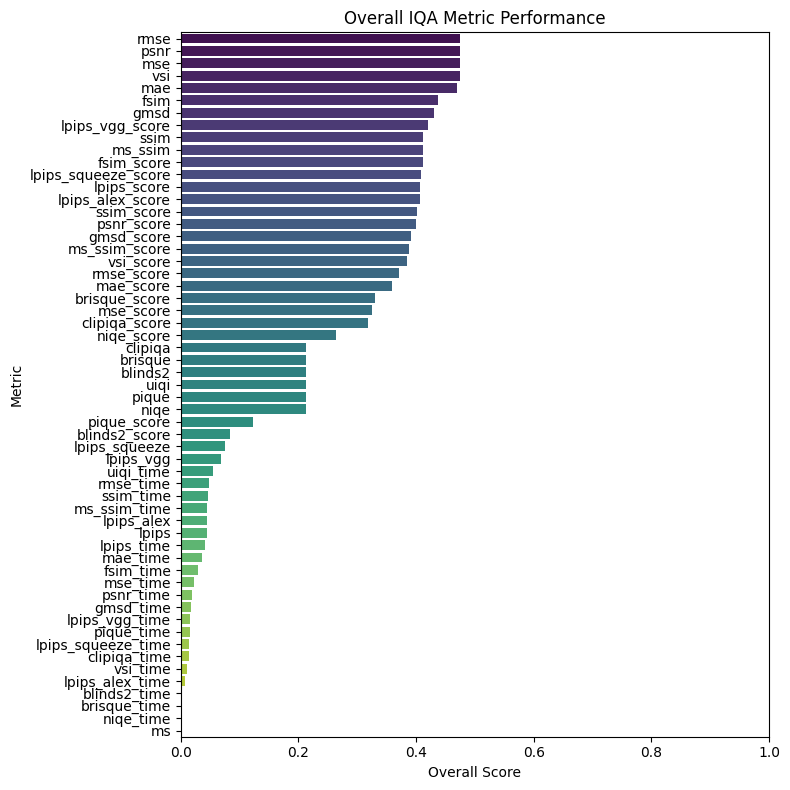

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/182392754.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


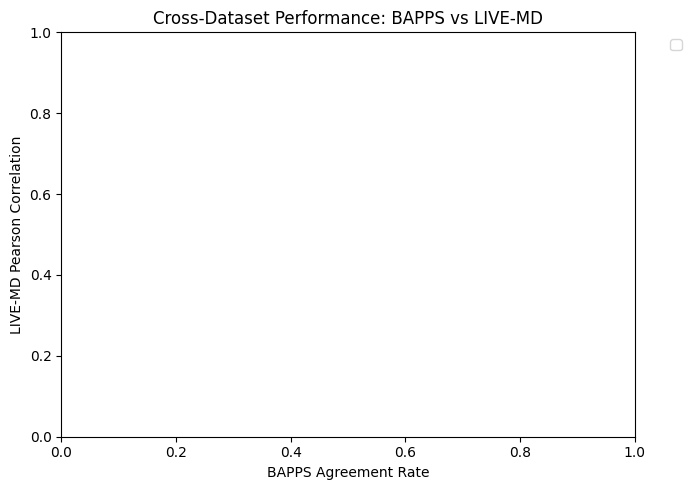

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/182392754.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cat_perf.values, y=cat_perf.index, palette='crest')


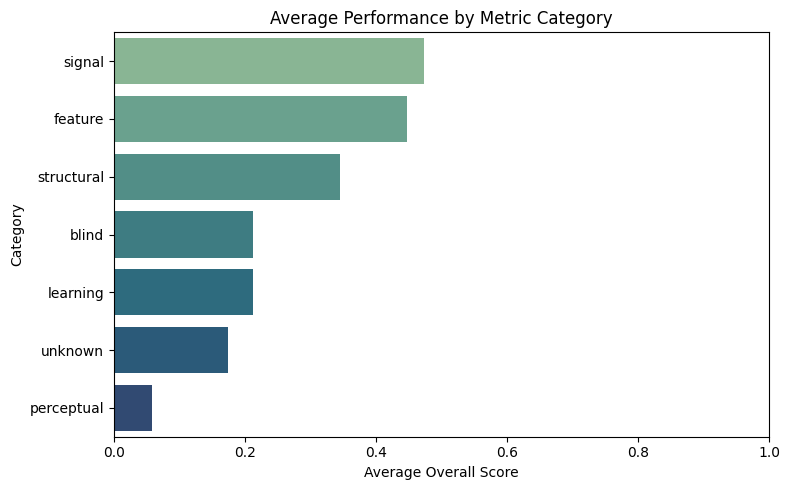

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/182392754.py:45: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


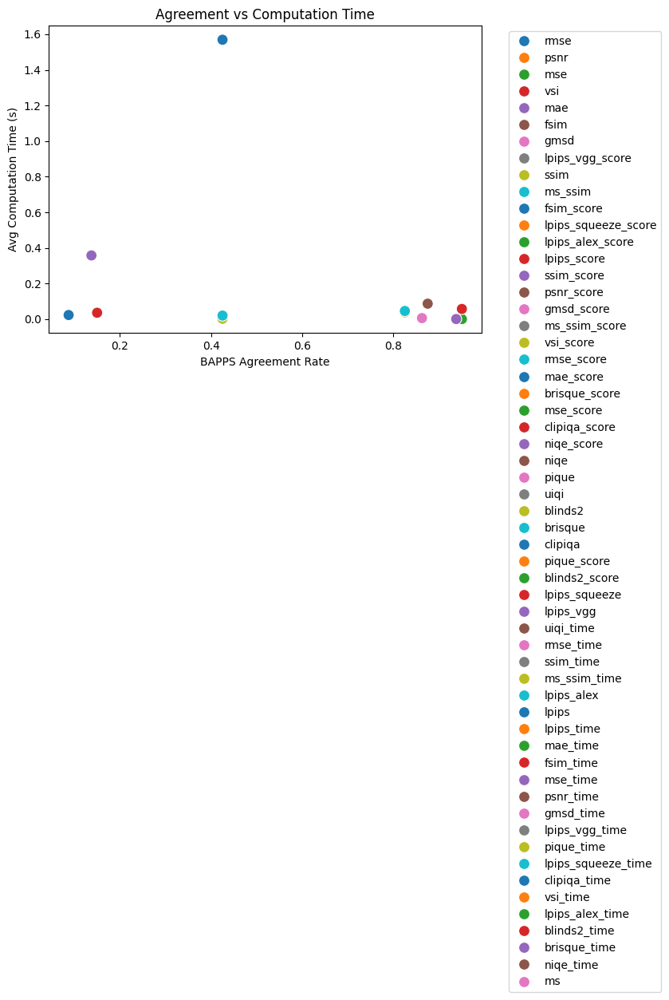

In [28]:
# Visualize comprehensive performance summary (bar, scatter, and category analysis)
# columns Metric,BAPPS_Agreement, LIVE_MD_Pearson_Abs, LIVE_MD_Spearman_Abs, Avg_Computation_Time_s, Category,Type, Overall_Performance_Score
score_df = perf_df[['Metric', 'Overall_Performance_Score']].copy()
if perf_df is not None and 'Metric' in perf_df.columns and 'Overall_Performance_Score' in perf_df.columns:
    plt.figure(figsize=(8, 8))
    sorted_perf = perf_df.sort_values('Overall_Performance_Score', ascending=False)
    sns.barplot(x='Overall_Performance_Score', y='Metric', data=sorted_perf, palette='viridis')
    plt.title('Overall IQA Metric Performance')
    plt.xlabel('Overall Score')
    plt.ylabel('Metric')
    plt.xlim(0, 1)
    plt.tight_layout()
    plt.show()
    # Scatter: BAPPS vs LIVE-MD (if available)
    if 'BAPPS_Agreement' in perf_df.columns and 'LIVE_MD_Pearson_Abs' in perf_df.columns:
        plt.figure(figsize=(7, 5))
        sns.scatterplot(x=perf_df['BAPPS_Agreement'], y=perf_df['LIVE_MD_Pearson_Abs'], hue=perf_df['Metric'], palette='tab10', s=100)
        plt.title('Cross-Dataset Performance: BAPPS vs LIVE-MD')
        plt.xlabel('BAPPS Agreement Rate')
        plt.ylabel('LIVE-MD Pearson Correlation')
        plt.xlim(0, 1)
        plt.ylim(0, 1)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
    # Category analysis
    if 'Category' in perf_df.columns:
        plt.figure(figsize=(8, 5))
        cat_perf = perf_df.groupby('Category')['Overall_Performance_Score'].mean().sort_values(ascending=False)
        sns.barplot(x=cat_perf.values, y=cat_perf.index, palette='crest')
        plt.title('Average Performance by Metric Category')
        plt.xlabel('Average Overall Score')
        plt.ylabel('Category')
        plt.xlim(0, 1)
        plt.tight_layout()
        plt.show()
    # Additional scatter plot: Agreement vs computation time
    if 'BAPPS_Agreement' in perf_df.columns and 'Avg_Computation_Time_s' in perf_df.columns:
        plt.figure(figsize=(7, 5))
        sns.scatterplot(x=perf_df['BAPPS_Agreement'], y=perf_df['Avg_Computation_Time_s'], hue=perf_df['Metric'], palette='tab10', s=100)
        plt.title('Agreement vs Computation Time')
        plt.xlabel('BAPPS Agreement Rate')
        plt.ylabel('Avg Computation Time (s)')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

## Section 5: Custom Dataset Results (if available)

If you have results for a custom dataset, this section will visualize the metric performance for your specific data.

In [60]:
print("Unique values in 'metric' column:")
print(custom_df['metric'].unique())
print(f"\nNumber of unique metrics: {custom_df['metric'].nunique()}")

print("\nUnique values in 'dataset' column:")
print(custom_df['dataset'].unique())

print("\nUnique values in 'distortion_type' column:")
print(custom_df['distortion_type'].unique())

print("\nUnique values in 'metric_type' column:")
print(custom_df['metric_type'].unique())

print("\nValue counts for each metric:")
print(custom_df['metric'].value_counts())

Unique values in 'metric' column:
['brisque' 'niqe' 'clipiqa' 'blinds2' 'pique' 'ssim' 'ms_ssim' 'uiqi'
 'psnr' 'mse' 'mae' 'rmse' 'lpips' 'fsim' 'vsi' 'gmsd' 'lpips_alex'
 'lpips_vgg' 'lpips_squeeze']

Number of unique metrics: 19

Unique values in 'dataset' column:
['generated' 'Skin' 'ElectronMicroscope' 'X-ray' 'lungMRI' 'MRI' 'text'
 'satilite' 'CFD']

Unique values in 'distortion_type' column:
['original' 'gaussian_blur' 'gaussian_noise' 'jpeg_compression']

Unique values in 'metric_type' column:
['NR' 'FR']

Value counts for each metric:
metric
brisque          1121
clipiqa          1121
blinds2          1121
pique            1121
niqe             1121
lpips            1008
lpips_vgg        1008
lpips_alex       1008
gmsd             1008
vsi              1008
fsim             1008
mse              1008
rmse             1008
mae              1008
psnr             1008
uiqi             1008
ms_ssim          1008
ssim             1008
lpips_squeeze    1008
Name: count, dtype: int6

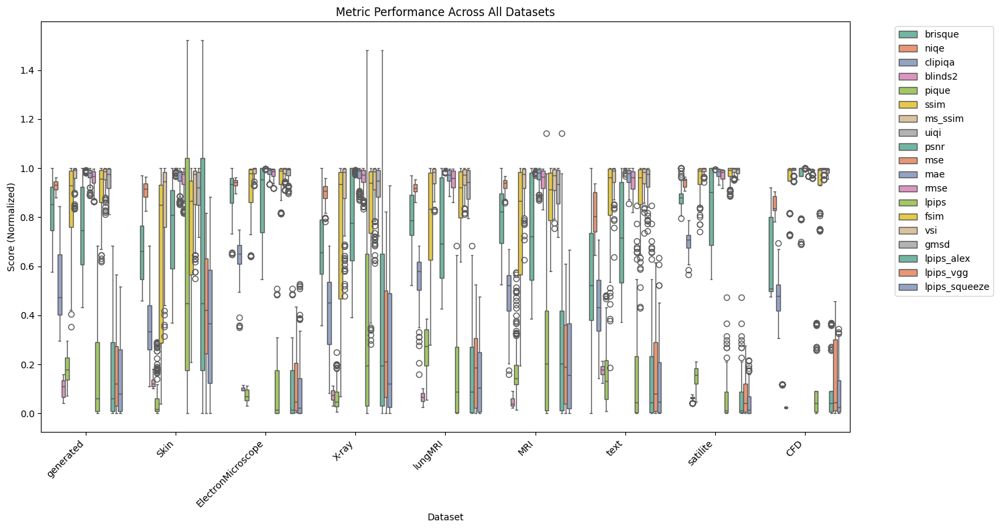

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='metric', y='score', data=dataset_data, ax=axes[i], palette='viridis')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='metric', y='score', data=dataset_data, ax=axes[i], palette='viridis')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='metric', y='sc

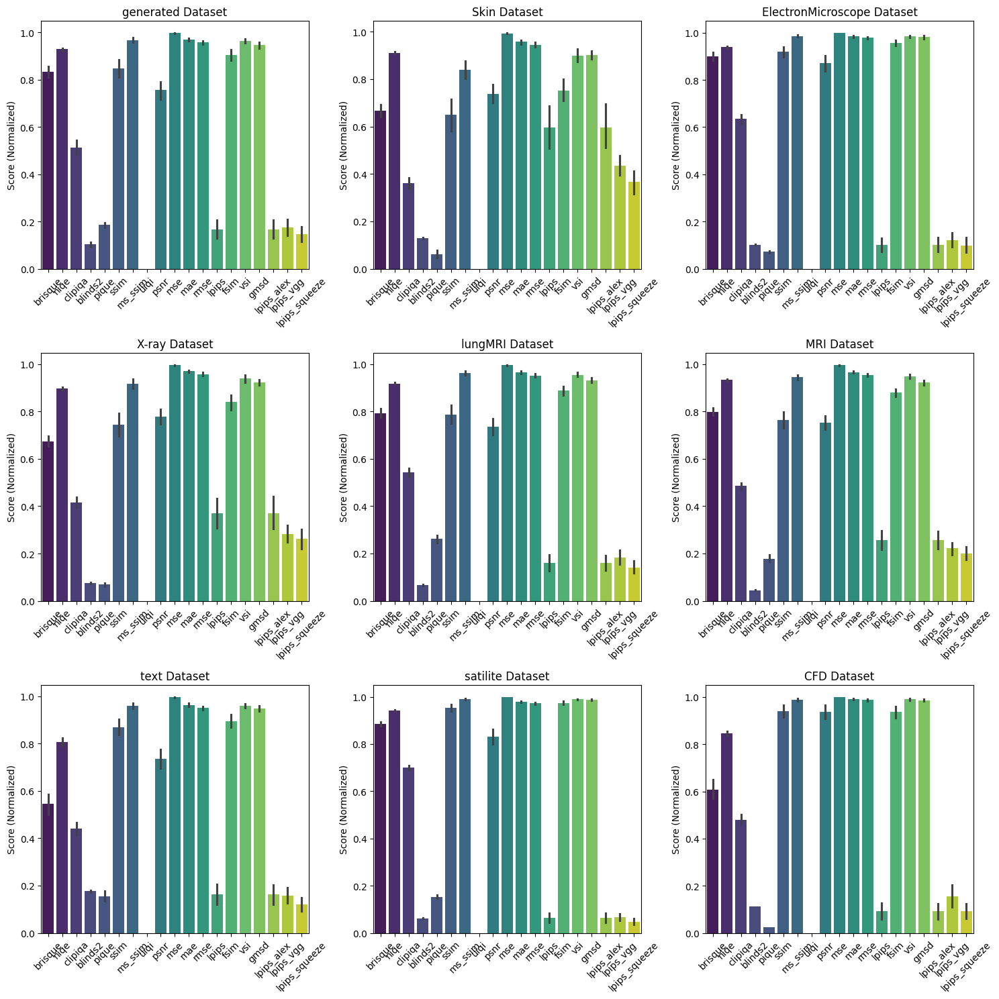

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


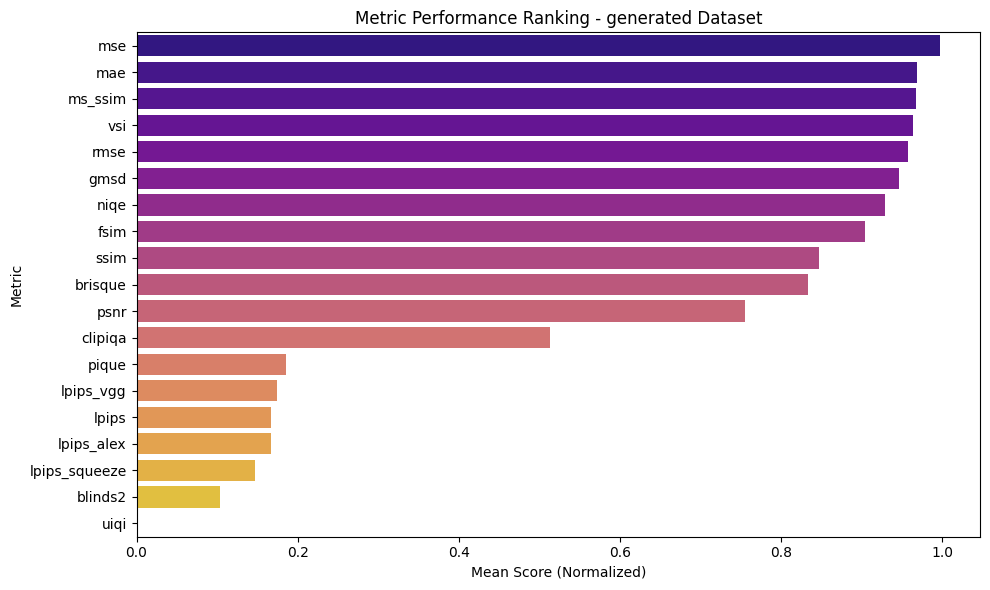

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


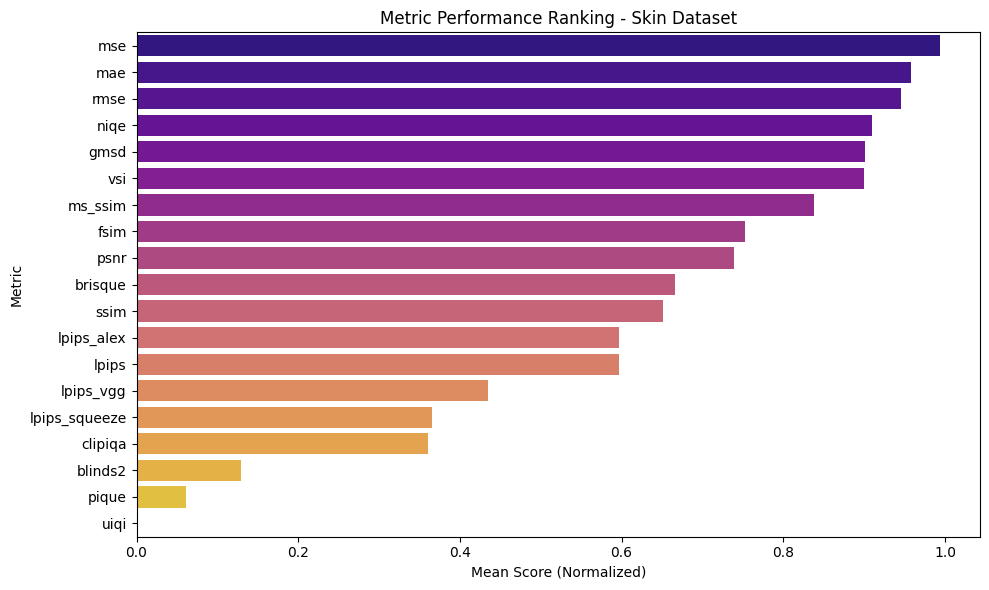

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


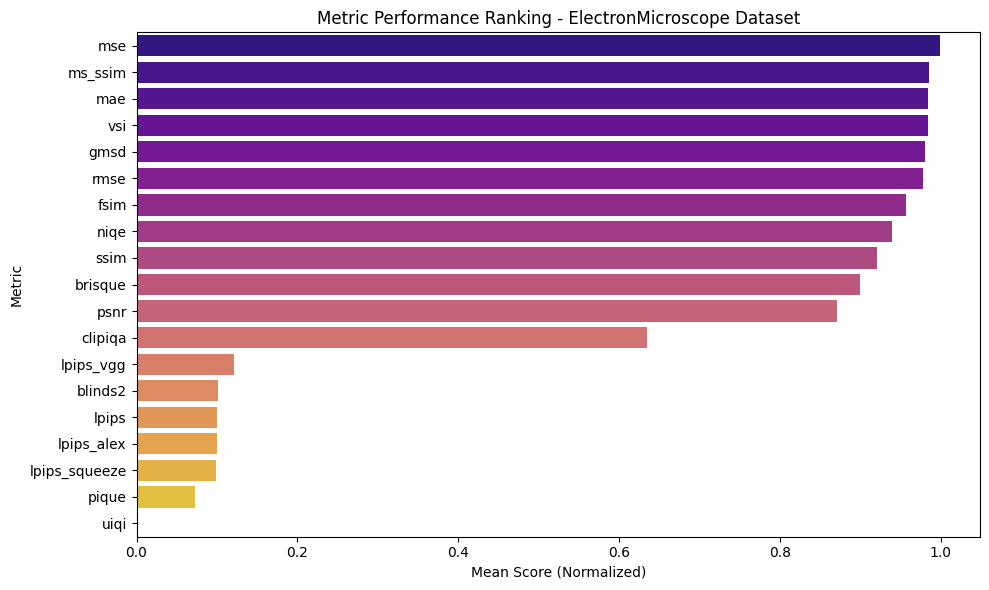

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


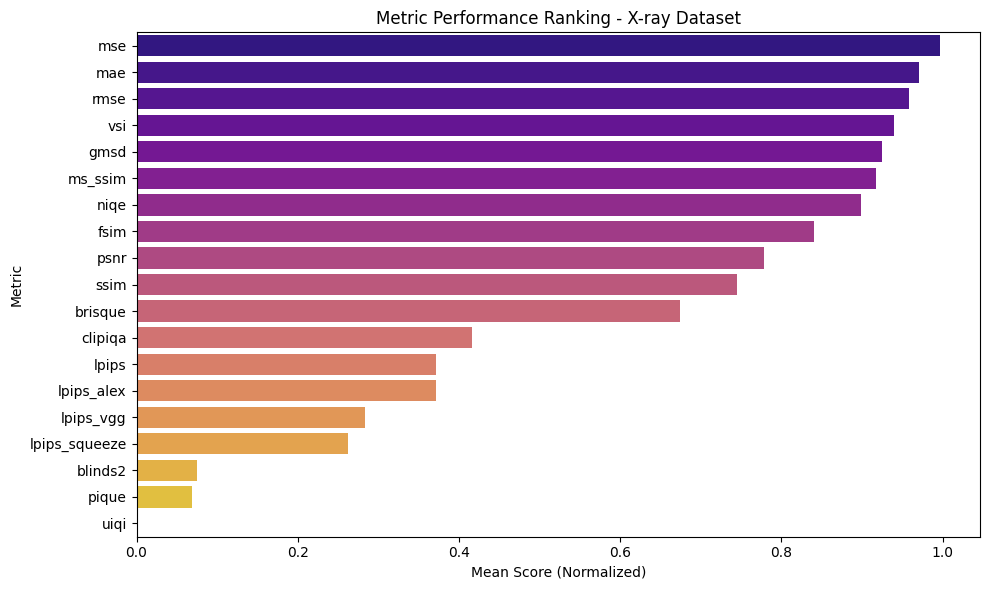

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


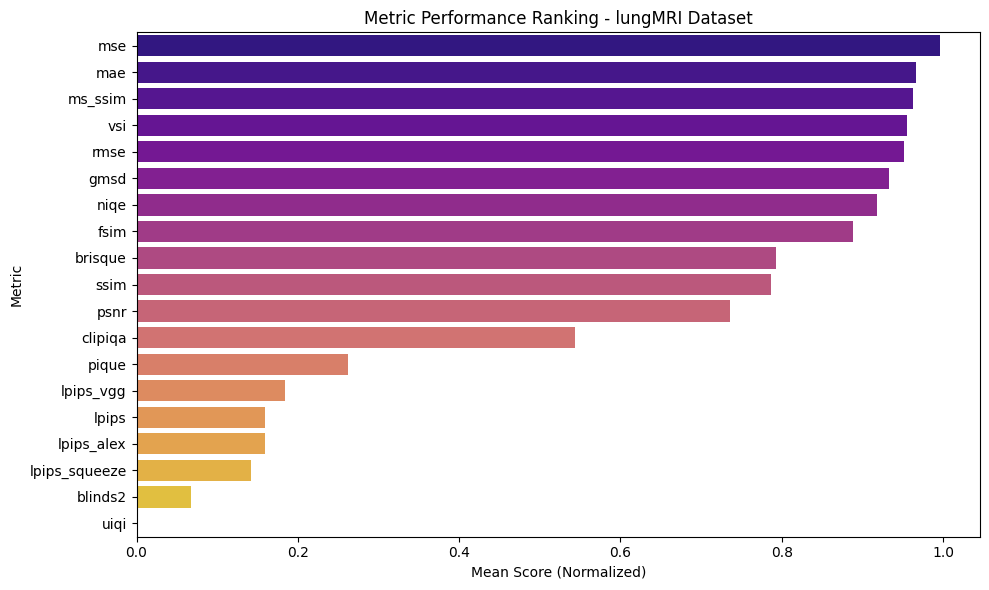

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


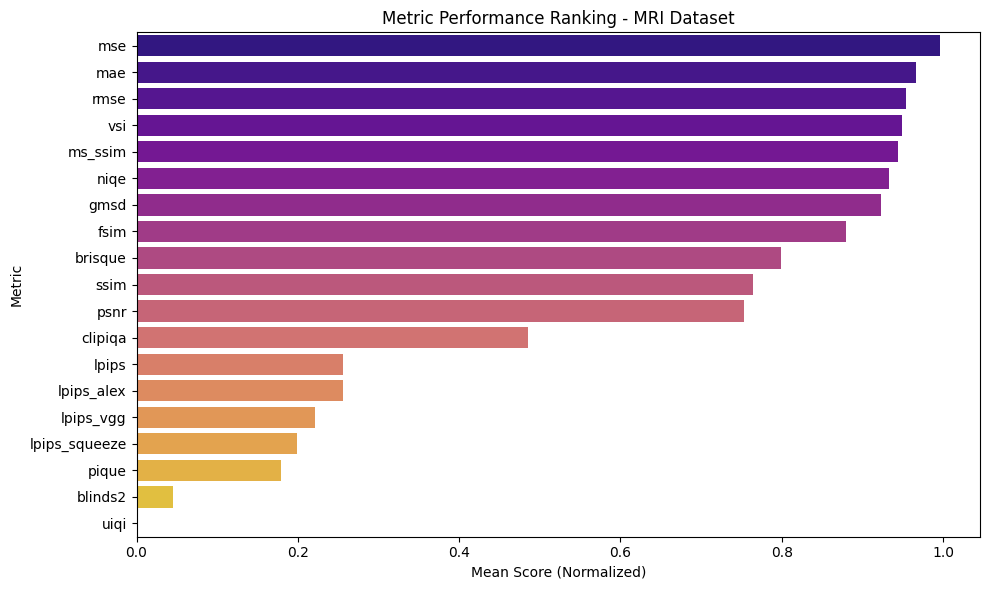

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


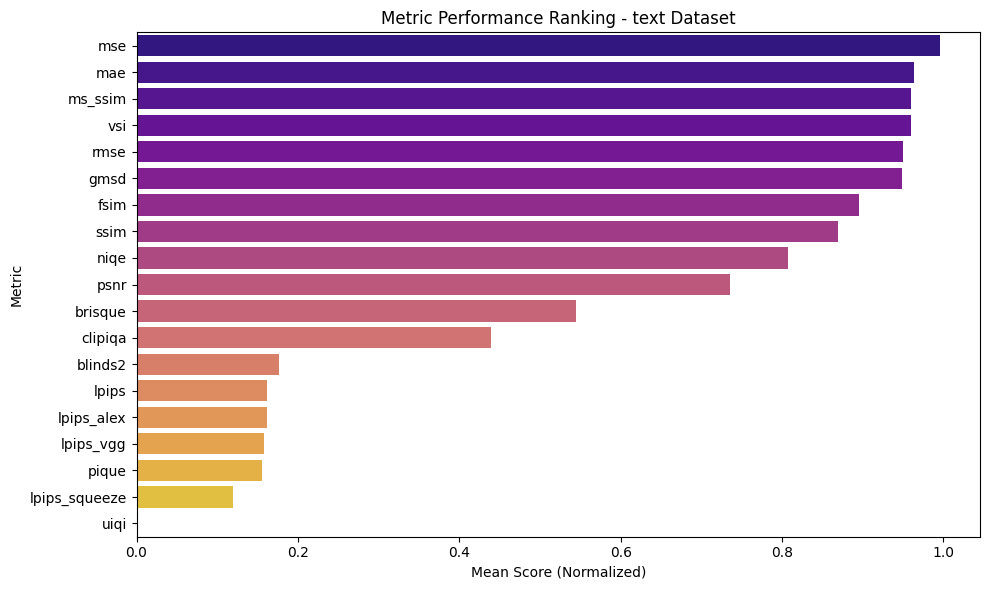

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


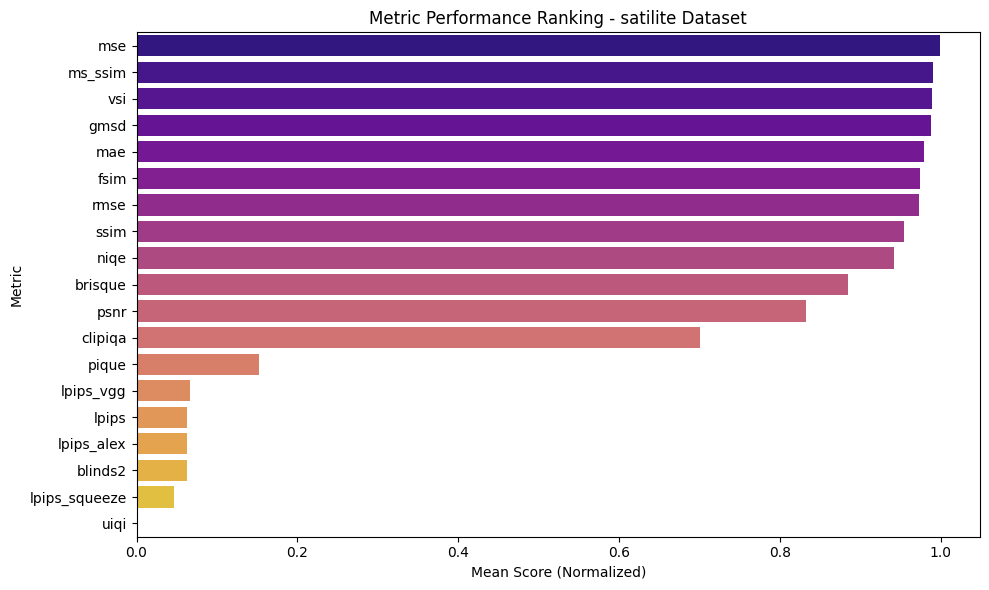

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_53053/842655870.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


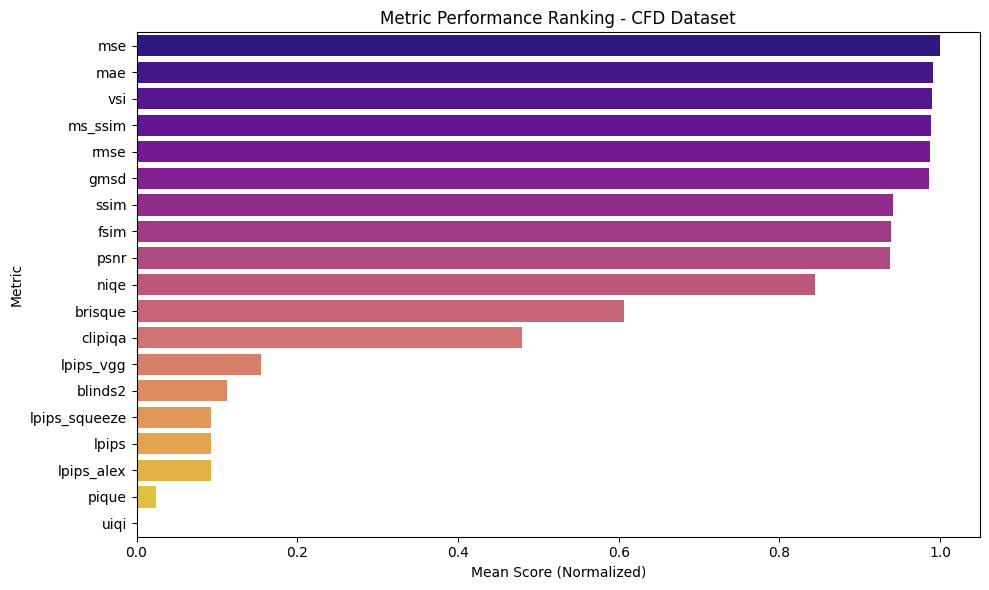

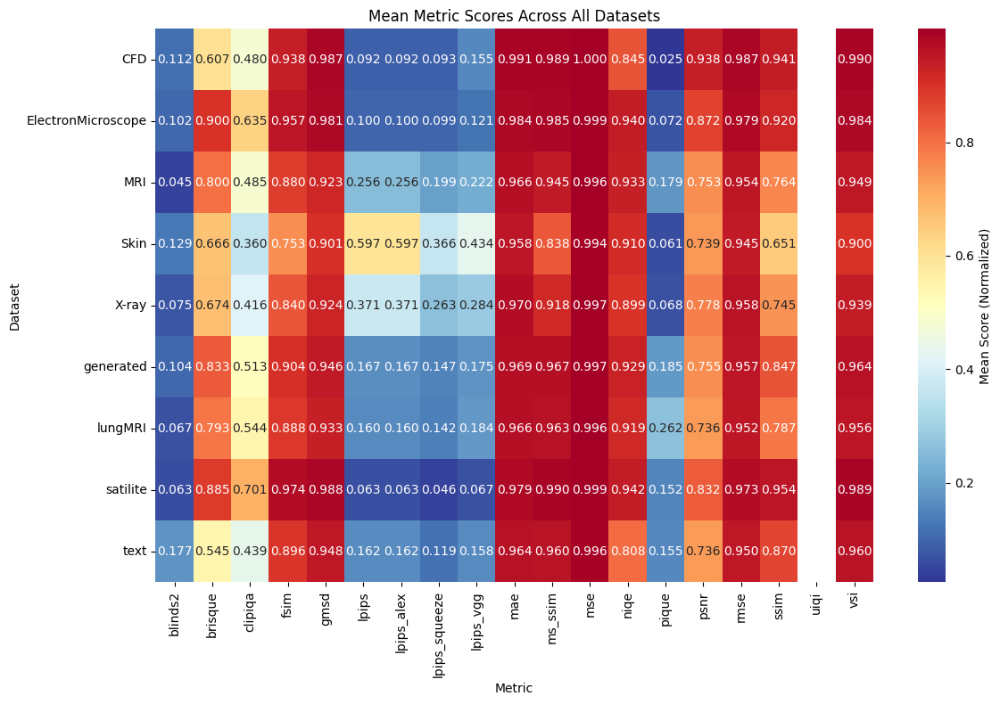


STATISTICAL SUMMARY BY DATASET

GENERATED DATASET:
----------------------------------------
Best Metric: mse (Mean Score: 0.997)
Worst Metric: blinds2 (Mean Score: 0.104)
Number of Images: 92
Score Range: 1.000

SKIN DATASET:
----------------------------------------
Best Metric: mse (Mean Score: 0.994)
Worst Metric: pique (Mean Score: 0.061)
Number of Images: 111
Score Range: 1.521

ELECTRONMICROSCOPE DATASET:
----------------------------------------
Best Metric: mse (Mean Score: 0.999)
Worst Metric: pique (Mean Score: 0.072)
Number of Images: 83
Score Range: 1.000

X-RAY DATASET:
----------------------------------------
Best Metric: mse (Mean Score: 0.997)
Worst Metric: pique (Mean Score: 0.068)
Number of Images: 166
Score Range: 1.481

LUNGMRI DATASET:
----------------------------------------
Best Metric: mse (Mean Score: 0.996)
Worst Metric: blinds2 (Mean Score: 0.067)
Number of Images: 120
Score Range: 1.000

MRI DATASET:
----------------------------------------
Best Metric: mse (

In [9]:
# Visualize custom dataset results by individual dataset
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns and 'dataset' in custom_df.columns:
    datasets = custom_df['dataset'].unique()
    
    # 1. Box plot comparing metric performance across all datasets
    plt.figure(figsize=(15, 8))
    sns.boxplot(x='dataset', y='score', hue='metric', data=custom_df, palette='Set2')
    plt.title('Metric Performance Across All Datasets')
    plt.xlabel('Dataset')
    plt.ylabel('Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # 2. Individual dataset analysis - create subplots for each dataset
    n_datasets = len(datasets)
    n_cols = 3
    n_rows = (n_datasets + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten() if n_datasets > 1 else [axes]
    
    for i, dataset in enumerate(datasets):
        dataset_data = custom_df[custom_df['dataset'] == dataset]
        
        if i < len(axes):
            sns.barplot(x='metric', y='score', data=dataset_data, ax=axes[i], palette='viridis')
            axes[i].set_title(f'{dataset} Dataset')
            # axes[i].set_xlabel('Metric')
            # axes[i].set_ylabel('Score')
            # axis labels off
            axes[i].set_xlabel('')
            axes[i].set_ylabel('Score (Normalized)')
            axes[i].tick_params(axis='x', rotation=45)
    
    # Hide unused subplots
    for i in range(len(datasets), len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
    # 3. Mean performance ranking for each dataset
    for dataset in datasets:
        dataset_data = custom_df[custom_df['dataset'] == dataset]
        metric_means = dataset_data.groupby('metric')['score'].mean().sort_values(ascending=False)
        
        plt.figure(figsize=(10, 6))
        sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')
        plt.title(f'Metric Performance Ranking - {dataset} Dataset')
        plt.xlabel('Mean Score (Normalized)')
        plt.ylabel('Metric')
        plt.tight_layout()
        plt.show()
    
    # 4. Heatmap showing mean scores across datasets and metrics
    dataset_metric_pivot = custom_df.groupby(['dataset', 'metric'])['score'].mean().unstack()
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(dataset_metric_pivot, annot=True, cmap='RdYlBu_r', fmt='.3f', 
                cbar_kws={'label': 'Mean Score (Normalized)'})
    plt.title('Mean Metric Scores Across All Datasets')
    plt.xlabel('Metric')
    plt.ylabel('Dataset')
    plt.tight_layout()
    plt.show()
    
    # 5. Statistical summary table for each dataset
    print("\n" + "="*80)
    print("STATISTICAL SUMMARY BY DATASET")
    print("="*80)
    
    for dataset in datasets:
        dataset_data = custom_df[custom_df['dataset'] == dataset]
        print(f"\n{dataset.upper()} DATASET:")
        print("-" * 40)
        
        # Best performing metric
        best_metric = dataset_data.groupby('metric')['score'].mean().idxmax()
        best_score = dataset_data.groupby('metric')['score'].mean().max()
        print(f"Best Metric: {best_metric} (Mean Score: {best_score:.3f})")
        
        # Worst performing metric
        worst_metric = dataset_data.groupby('metric')['score'].mean().idxmin()
        worst_score = dataset_data.groupby('metric')['score'].mean().min()
        print(f"Worst Metric: {worst_metric} (Mean Score: {worst_score:.3f})")
        
        # Number of images
        n_images = dataset_data.shape[0] // dataset_data['metric'].nunique()
        print(f"Number of Images: {n_images}")
        
        # Score range
        score_range = dataset_data['score'].max() - dataset_data['score'].min()
        print(f"Score Range: {score_range:.3f}")

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/2289711133.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='metric', y='score', data=custom_df, palette='Set2')


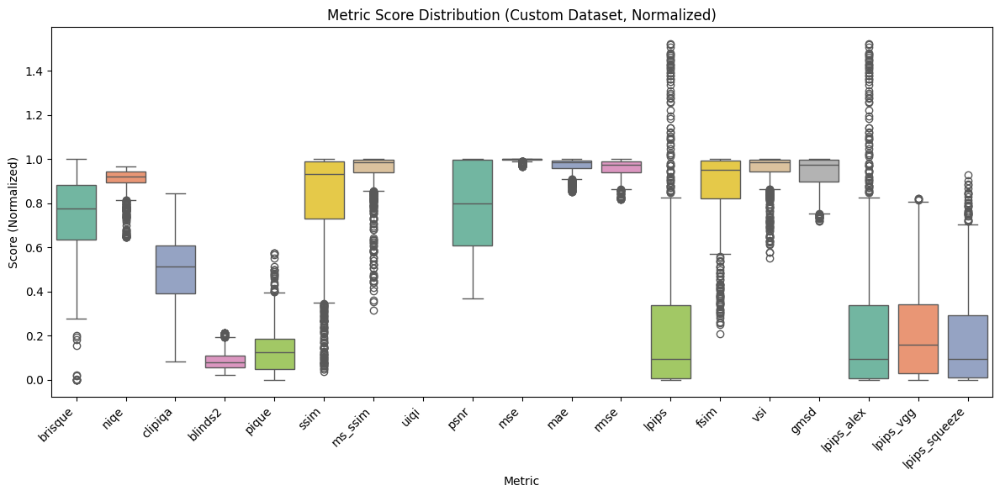

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/2289711133.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='metric', y='score', data=custom_df, palette='Set3')


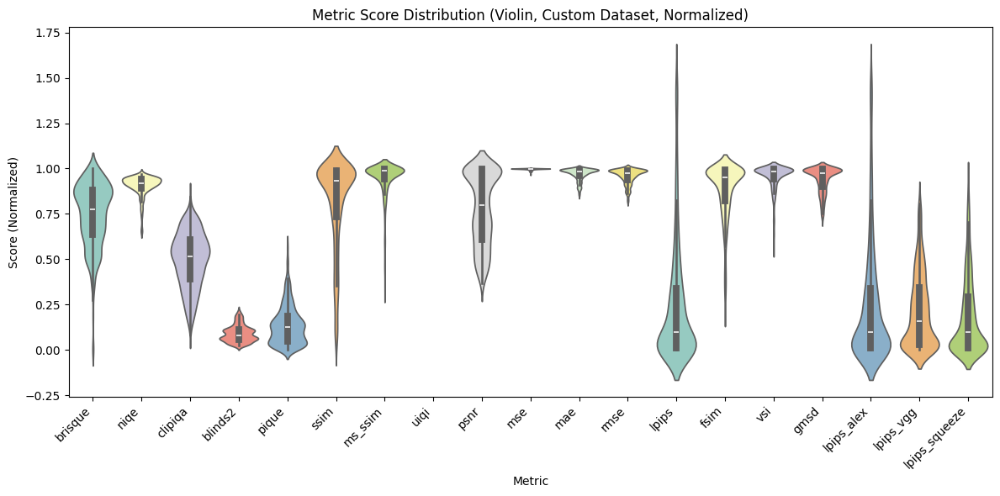

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/2289711133.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='metric', y='score', data=custom_df, palette='Set1', jitter=True, size=3)


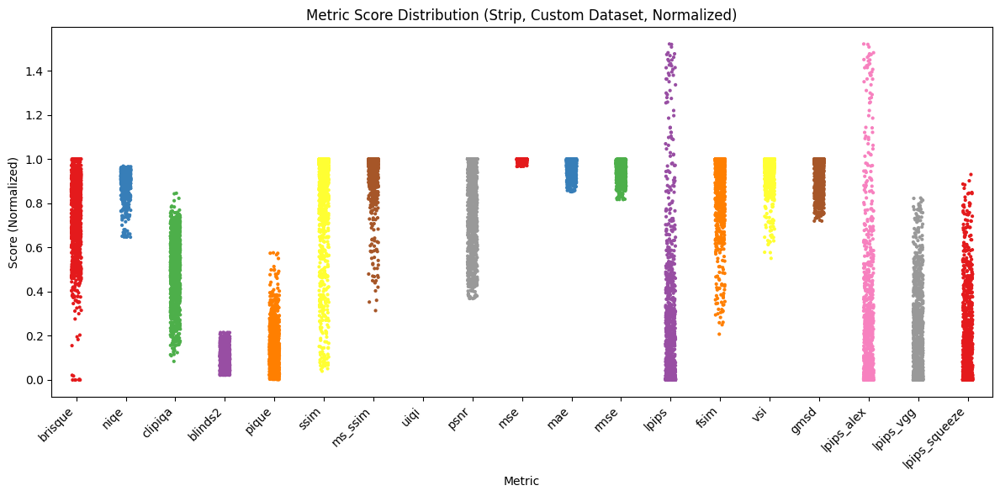

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/2289711133.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.index, y=metric_means.values, palette='viridis')


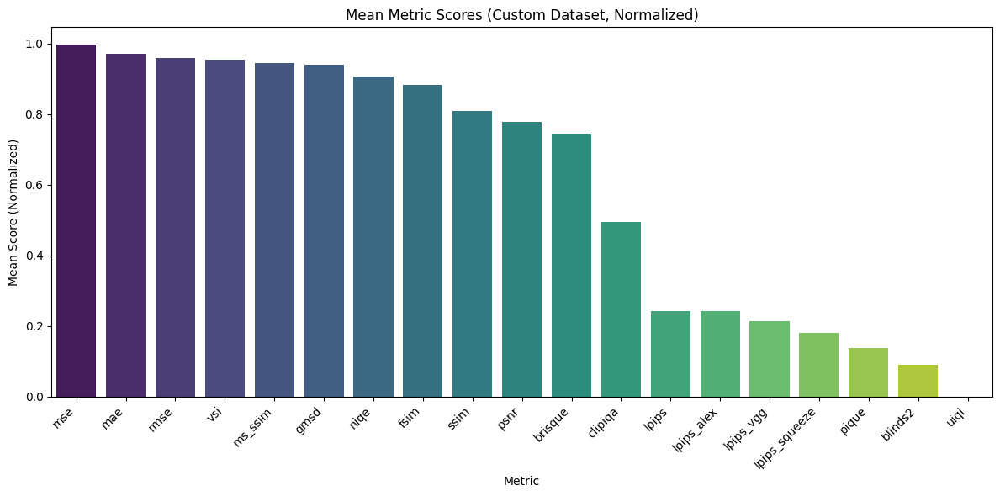

In [61]:
# Visualize custom dataset results if available (using normalized scores)
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    # Create visualizations that work with the long format data
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='metric', y='score', data=custom_df, palette='Set2')
    plt.title('Metric Score Distribution (Custom Dataset, Normalized)')
    plt.xlabel('Metric')
    plt.ylabel('Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(12, 6))
    sns.violinplot(x='metric', y='score', data=custom_df, palette='Set3')
    plt.title('Metric Score Distribution (Violin, Custom Dataset, Normalized)')
    plt.xlabel('Metric')
    plt.ylabel('Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    plt.figure(figsize=(12, 6))
    sns.stripplot(x='metric', y='score', data=custom_df, palette='Set1', jitter=True, size=3)
    plt.title('Metric Score Distribution (Strip, Custom Dataset, Normalized)')
    plt.xlabel('Metric')
    plt.ylabel('Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Additional bar chart showing mean scores per metric
    plt.figure(figsize=(12, 6))
    metric_means = custom_df.groupby('metric')['score'].mean().sort_values(ascending=False)
    sns.barplot(x=metric_means.index, y=metric_means.values, palette='viridis')
    plt.title('Mean Metric Scores (Custom Dataset, Normalized)')
    plt.xlabel('Metric')
    plt.ylabel('Mean Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

## Section 6: Summary and Guidance

- Use the BAPPS agreement plots to select metrics that align with human perceptual judgments.
- Use the LIVE-MD correlation and scatter/heatmap plots to select metrics that best reflect human MOS ratings.
- The overall performance summary and category analysis help you choose the most robust metrics across datasets.
- For custom data, review the score distributions to identify stable and discriminative metrics.

All visualizations are ready for direct use in your IEEE-format research document.

## Section 2A: BAPPS - Metric Agreement (Pie, KDE, ECDF, Pairplot, Heatmap)

Additional visualizations to understand metric agreement and score distributions in the BAPPS dataset.

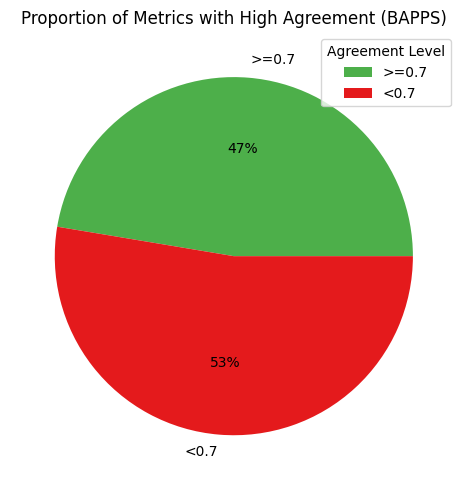

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3150932065.py:29: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(bapps_df[col].dropna(), label=col, fill=True, alpha=0.2)
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3150932065.py:29: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(bapps_df[col].dropna(), label=col, fill=True, alpha=0.2)
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3150932065.py:29: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(bapps_df[col].dropna(), label=col, fill=True, alpha=0.2)
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3150932065.py:29: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warn

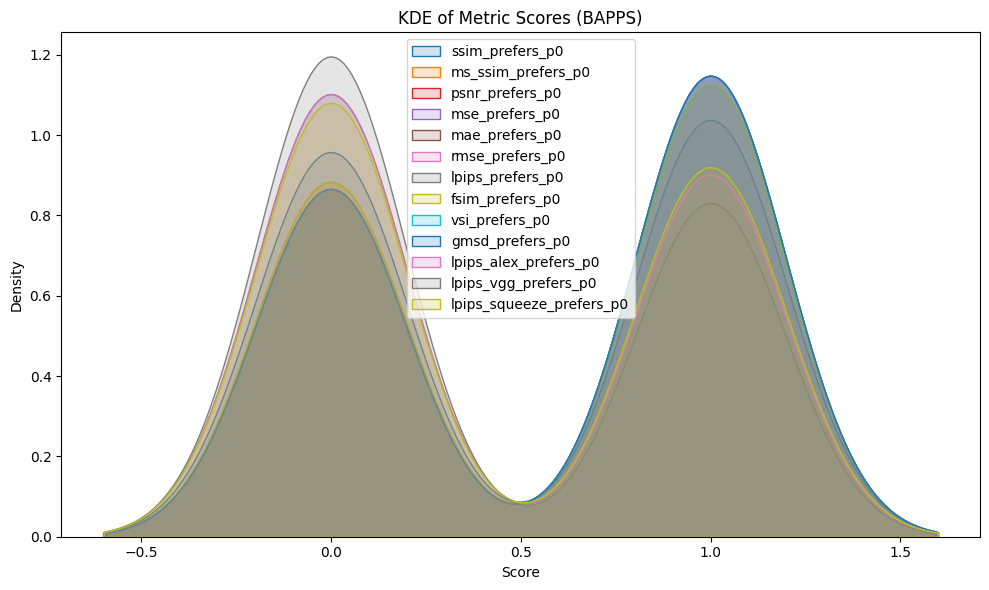

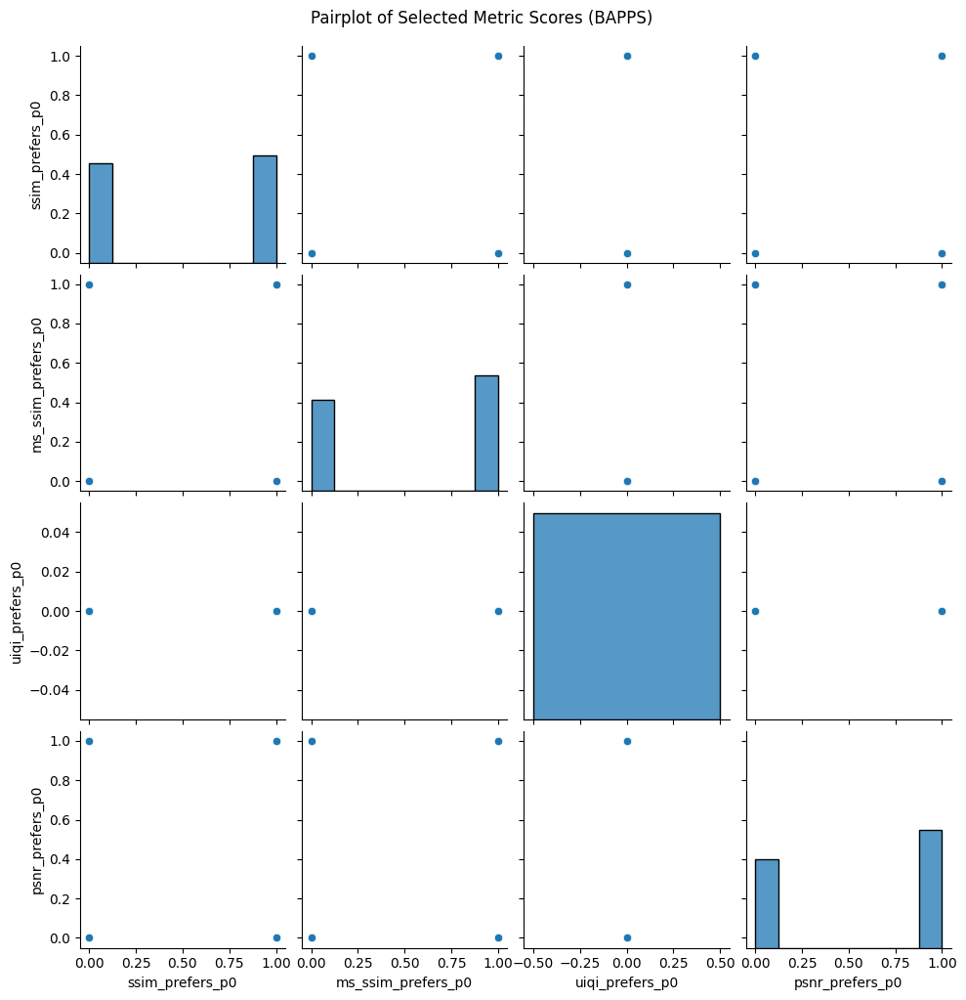

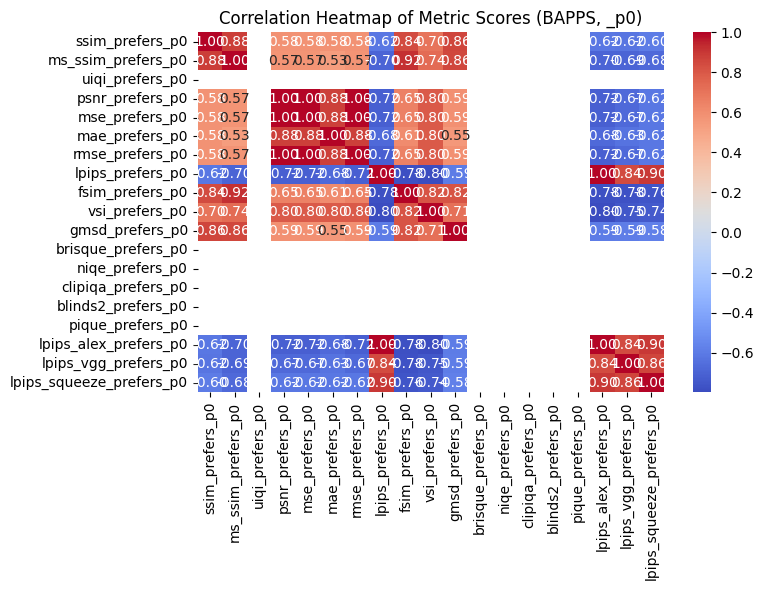

In [30]:
# Pie chart: Proportion of metrics above/below 0.7 agreement
if bapps_df is not None:
    pref_cols = [col for col in bapps_df.columns if col.endswith('_prefers_p0')]
    if 'human_judgment' in bapps_df.columns and pref_cols:
        clear_prefs = bapps_df[bapps_df['human_judgment'] != 0.5]
        human_prefers_p0 = clear_prefs['human_judgment'] < 0.5
        agreement_rates = {}
        for col in pref_cols:
            metric = col.replace('_prefers_p0', '')
            metric_prefers_p0 = clear_prefs[col]
            if metric_prefers_p0.notna().sum() > 0:
                agreements = metric_prefers_p0 == human_prefers_p0
                agreement_rates[metric] = agreements.mean()
        high = sum(np.array(list(agreement_rates.values())) >= 0.7)
        low = sum(np.array(list(agreement_rates.values())) < 0.7)
        plt.figure(figsize=(5,5))
        plt.pie([high, low], labels=['>=0.7', '<0.7'], autopct='%1.0f%%', colors=['#4daf4a','#e41a1c'])
        plt.title('Proportion of Metrics with High Agreement (BAPPS)')
        # legend
        plt.legend(title='Agreement Level', loc='upper right', )
        plt.tight_layout()
        plt.show()
# KDE plot: Distribution of all metric scores (p0 and p1)
if bapps_df is not None:
    metric_score_cols = [col for col in bapps_df.columns if col.endswith('_p0') or col.endswith('_p1')]
    if metric_score_cols:
        plt.figure(figsize=(10,6))
        for col in metric_score_cols:
            sns.kdeplot(bapps_df[col].dropna(), label=col, fill=True, alpha=0.2)
        plt.title('KDE of Metric Scores (BAPPS)')
        plt.xlabel('Score')
        plt.ylabel('Density')
        plt.legend()
        plt.tight_layout()
        plt.show()
# ECDF plot: Empirical CDF for a selected metric
if bapps_df is not None and 'ssim_p0' in bapps_df.columns:
    ecdf = ECDF(bapps_df['ssim_p0'].dropna())
    plt.figure(figsize=(7,5))
    plt.plot(ecdf.x, ecdf.y)
    plt.title('ECDF of SSIM_p0 (BAPPS)')
    plt.xlabel('SSIM_p0 Score')
    plt.ylabel('ECDF')
    plt.tight_layout()
    plt.show()
# Pairplot: Pairwise relationships between metric scores
if bapps_df is not None:
    metric_score_cols = [col for col in bapps_df.columns if col.endswith('_p0')][:4]
    if len(metric_score_cols) >= 2:
        sns.pairplot(bapps_df[metric_score_cols].dropna())
        plt.suptitle('Pairplot of Selected Metric Scores (BAPPS)', y=1.02)
        plt.show()
# Heatmap: Correlation between metric scores (p0)
if bapps_df is not None:
    metric_score_cols = [col for col in bapps_df.columns if col.endswith('_p0')]
    if len(metric_score_cols) >= 2:
        corr = bapps_df[metric_score_cols].corr()
        plt.figure(figsize=(8,6))
        sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title('Correlation Heatmap of Metric Scores (BAPPS, _p0)')
        plt.tight_layout()
        plt.show()

## Section 3A: LIVE-MD - Metric Analysis (Box, Violin, Strip, Swarm, Joint, Heatmap)

Additional visualizations to understand metric performance and relationships in the LIVE-MD dataset.

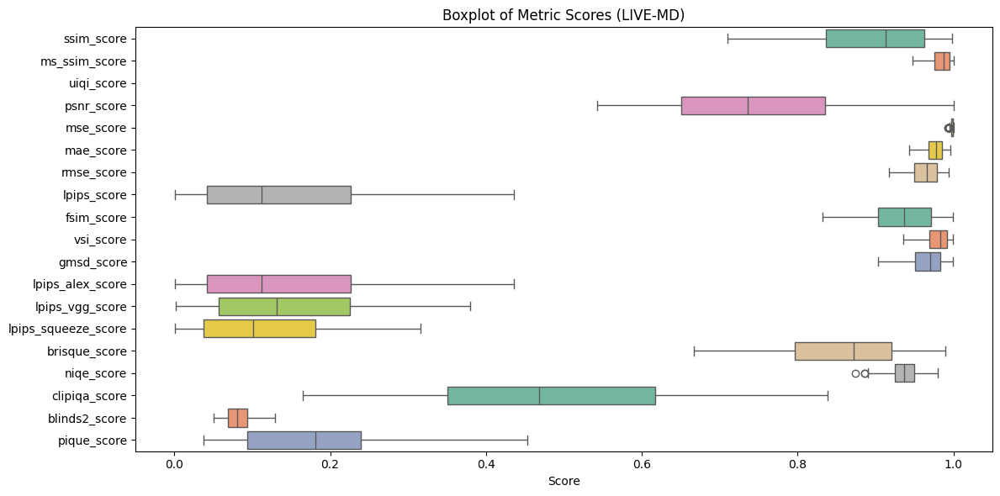

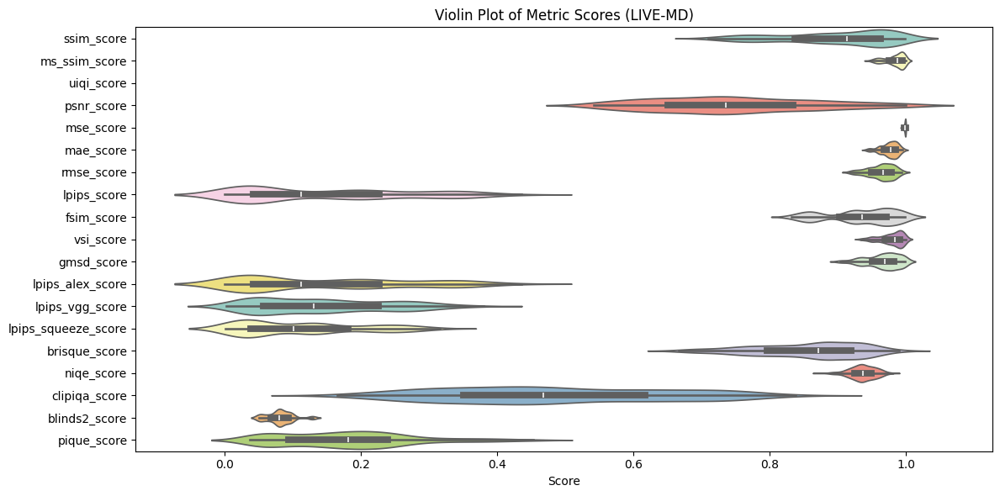

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(y=metric, data=live_md_df, jitter=True, palette='Set1')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(y=metric, data=live_md_df, jitter=True, palette='Set1')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(y=metric, data=live_md_df, jitter=True, palette=

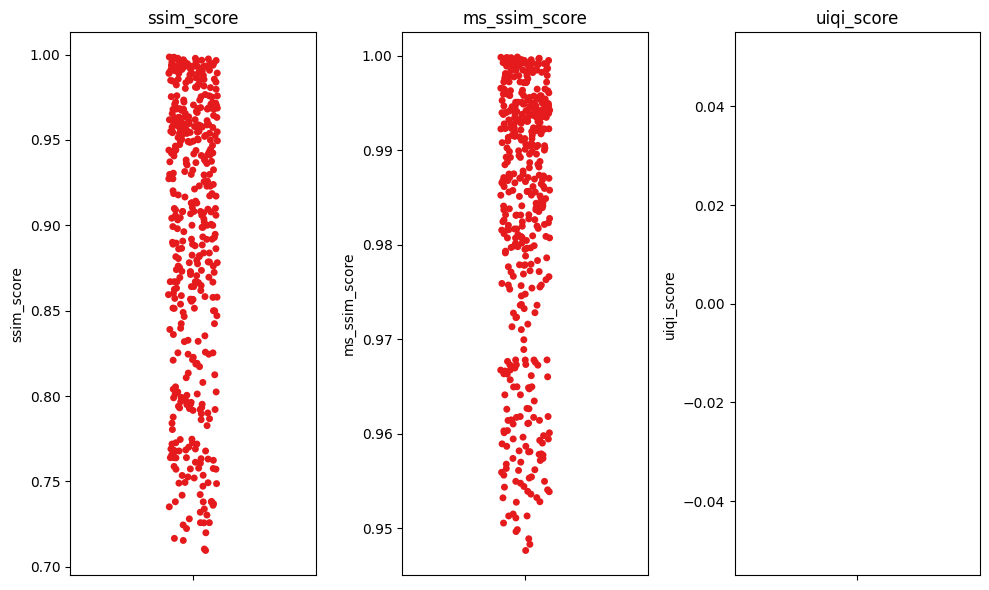

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(y=metric, data=live_md_df, palette='Set2')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(y=metric, data=live_md_df, palette='Set2')
/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/693695457.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.swarmplot(y=metric, data=live_md_df, palette='Set2')


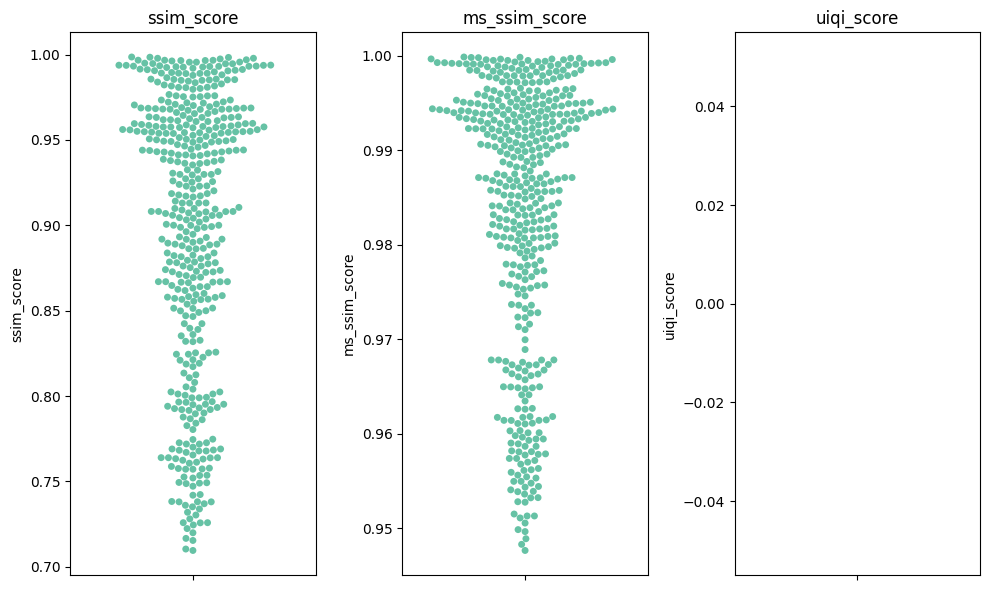

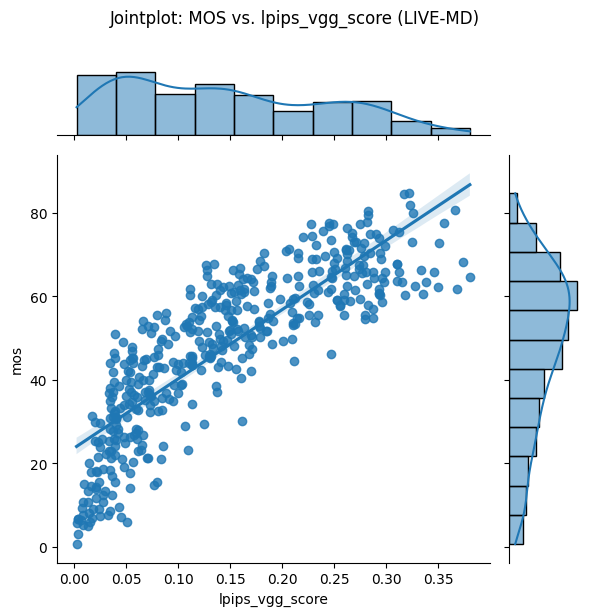

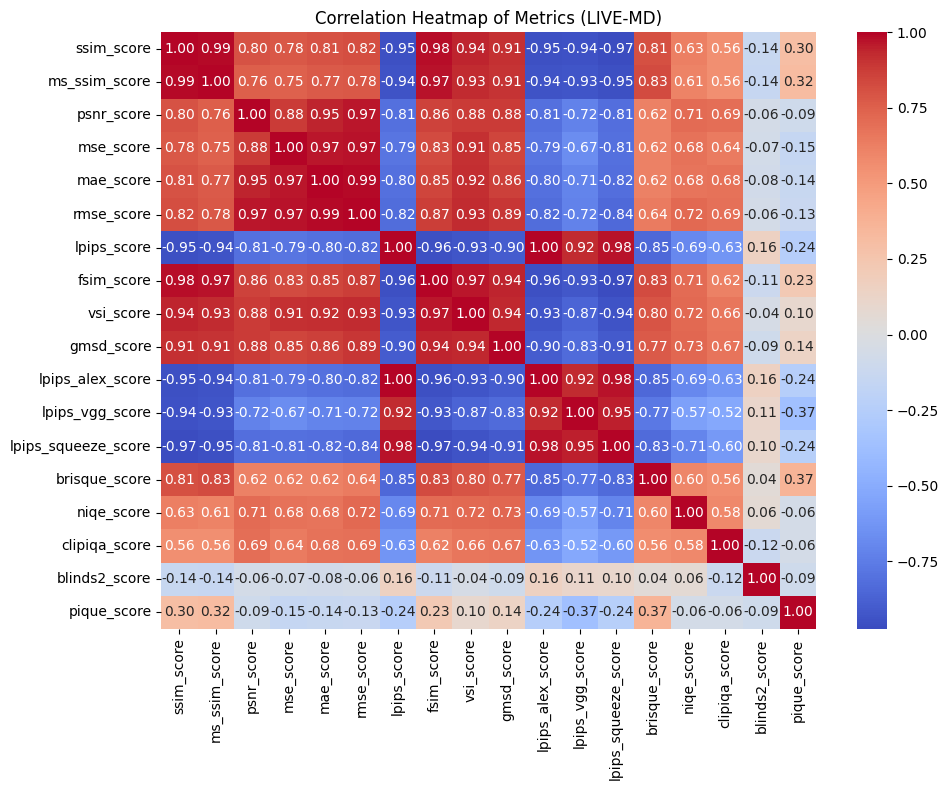

In [31]:
# Boxplot: Distribution of metric scores (LIVE-MD)
if live_md_df is not None:
    # Filter out time-related metrics and non-numeric columns
    metric_cols = [col for col in live_md_df.columns 
                  if col not in ['sample_id', 'ref_path', 'dis_path', 'mos', 'distortion_type'] 
                  and live_md_df[col].dtype in ['float64', 'int64']
                  and not col.endswith('_time')]
    if metric_cols:
        plt.figure(figsize=(12,6))
        sns.boxplot(data=live_md_df[metric_cols], orient='h', palette='Set2')
        plt.title('Boxplot of Metric Scores (LIVE-MD)')
        plt.xlabel('Score')
        plt.tight_layout()
        plt.show()
# Violin plot: Distribution of metric scores (LIVE-MD)
if live_md_df is not None and metric_cols:
    plt.figure(figsize=(12,6))
    sns.violinplot(data=live_md_df[metric_cols], orient='h', palette='Set3')
    plt.title('Violin Plot of Metric Scores (LIVE-MD)')
    plt.xlabel('Score')
    plt.tight_layout()
    plt.show()
# Strip plot: Metric scores by distortion type - if there are different distortion types
if live_md_df is not None and 'distortion_type' in live_md_df.columns and metric_cols:
    # Check if there are multiple distortion types
    if live_md_df['distortion_type'].nunique() > 1:
        for metric in metric_cols[:3]:  # Limit to first 3 metrics for brevity
            plt.figure(figsize=(8,5))
            sns.stripplot(x='distortion_type', y=metric, data=live_md_df, jitter=True, palette='Set1')
            plt.title(f'Strip Plot: {metric} by Distortion Type (LIVE-MD)')
            plt.xlabel('Distortion Type')
            plt.ylabel(metric)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
    else:
        # Create strip plot showing distribution of metrics without distortion type grouping
        plt.figure(figsize=(10,6))
        for i, metric in enumerate(metric_cols[:3]):
            plt.subplot(1, 3, i+1)
            sns.stripplot(y=metric, data=live_md_df, jitter=True, palette='Set1')
            plt.title(f'{metric}')
        plt.tight_layout()
        plt.show()
# Swarm plot: Metric scores by distortion type - if multiple distortion types exist
if live_md_df is not None and 'distortion_type' in live_md_df.columns and metric_cols:
    # Check if there are multiple distortion types
    if live_md_df['distortion_type'].nunique() > 1:
        for metric in metric_cols[:3]:
            plt.figure(figsize=(8,5))
            sns.swarmplot(x='distortion_type', y=metric, data=live_md_df, palette='Set2')
            plt.title(f'Swarm Plot: {metric} by Distortion Type (LIVE-MD)')
            plt.xlabel('Distortion Type')
            plt.ylabel(metric)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
    else:
        # Alternative visualization when only one distortion type
        plt.figure(figsize=(10,6))
        for i, metric in enumerate(metric_cols[:3]):
            plt.subplot(1, 3, i+1)
            sns.swarmplot(y=metric, data=live_md_df, palette='Set2')
            plt.title(f'{metric}')
        plt.tight_layout()
        plt.show()
# Jointplot: MOS vs. best metric (only if MOS values exist)
if live_md_df is not None and metric_cols and live_md_df['mos'].notna().any():
    # Find metric with highest correlation to MOS
    valid_metrics = []
    for metric in metric_cols:
        if live_md_df[[metric, 'mos']].dropna().shape[0] > 5:  # At least 5 valid pairs
            valid_metrics.append(metric)
    
    if valid_metrics:
        best_metric = valid_metrics[0]  # Default to first if can't determine
        # Try to find best correlated metric
        try:
            correlations = []
            for metric in valid_metrics:
                corr = live_md_df[metric].corr(live_md_df['mos'], method='pearson')
                if not np.isnan(corr):
                    correlations.append((metric, abs(corr)))
            if correlations:
                correlations.sort(key=lambda x: x[1], reverse=True)
                best_metric = correlations[0][0]
        except:
            pass  # Use default if correlation fails
            
        # Plot jointplot with valid pairs
        valid_data = live_md_df[[best_metric, 'mos']].dropna()
        if len(valid_data) > 5:  # Only plot if enough data points
            sns.jointplot(x=valid_data[best_metric], y=valid_data['mos'], 
                         kind='reg', height=6)
            plt.suptitle(f'Jointplot: MOS vs. {best_metric} (LIVE-MD)', y=1.02)
            plt.tight_layout()
            plt.show()
# Heatmap: Correlation between all metrics (LIVE-MD)
if live_md_df is not None and len(metric_cols) > 1:
    # Only include columns with valid values
    valid_cols = []
    for col in metric_cols:
        if live_md_df[col].notna().sum() > 0:
            valid_cols.append(col)
    
    if len(valid_cols) > 1:
        corr = live_md_df[valid_cols].corr()
        plt.figure(figsize=(10,8))
        sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title('Correlation Heatmap of Metrics (LIVE-MD)')
        plt.tight_layout()
        plt.show()

## Section 5A: Custom Dataset - Advanced Visuals

More visualizations for custom dataset results, if available.

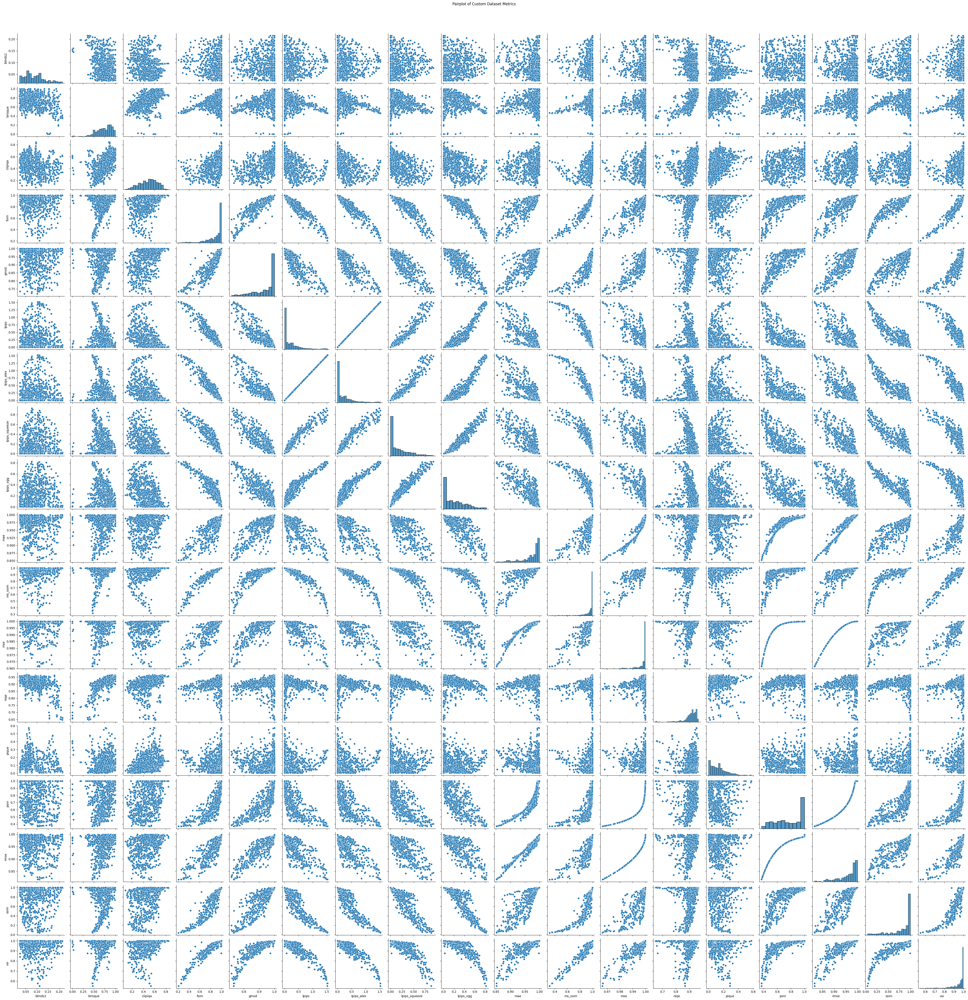

In [64]:
# Pairplot: Custom dataset metrics
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    if custom_df['metric'].nunique() > 1: 
        try:
            pivot_df = custom_df.pivot_table(index=['distorted_image_path', 'original_image', 'distortion_type', 'distortion_level'], columns='metric', values='score')
            # Drop rows with any NaN values that would prevent pairplot from working well
            pivot_df_cleaned = pivot_df.dropna()
            if not pivot_df_cleaned.empty and pivot_df_cleaned.shape[1] > 1:
                sns.pairplot(pivot_df_cleaned)
                plt.suptitle('Pairplot of Custom Dataset Metrics', y=1.02)
                plt.show()
            elif pivot_df.shape[1] > 1 : # if dropna results in empty df, try with original pivot
                print("Not enough non-NaN data for a meaningful pairplot after dropping NaNs. Trying with original pivot (might be sparse).")
                sns.pairplot(pivot_df.dropna(how='all', axis=0).dropna(how='all', axis=1)) # drop rows/cols that are all NaN
                plt.suptitle('Pairplot of Custom Dataset Metrics (Sparse Data)', y=1.02)
                plt.show()
            else:
                print("Not enough metric columns or data for pairplot after pivoting and cleaning.")
        except Exception as e:
            print(f"Could not generate pairplot due to an error: {e}")
            print("Attempting pivot with a simpler index if possible or skipping pairplot.")
            # Fallback: if the above pivot_table fails due to non-unique index/columns, try a simpler pivot
            # This might happen if the combination of index columns is not unique for each metric.
            # A simpler approach might be to group by image and then pivot, but that changes data structure.
            # For now, we'll stick to the original logic if the more robust pivot fails.
            if custom_df['metric'].nunique() > 1:
                pivot = custom_df.pivot(columns='metric', values='score') # Original simpler pivot
                if pivot.shape[1] > 1:
                    sns.pairplot(pivot.dropna())
                    plt.suptitle('Pairplot of Custom Dataset Metrics (Simpler Pivot)', y=1.02)
                    plt.show()


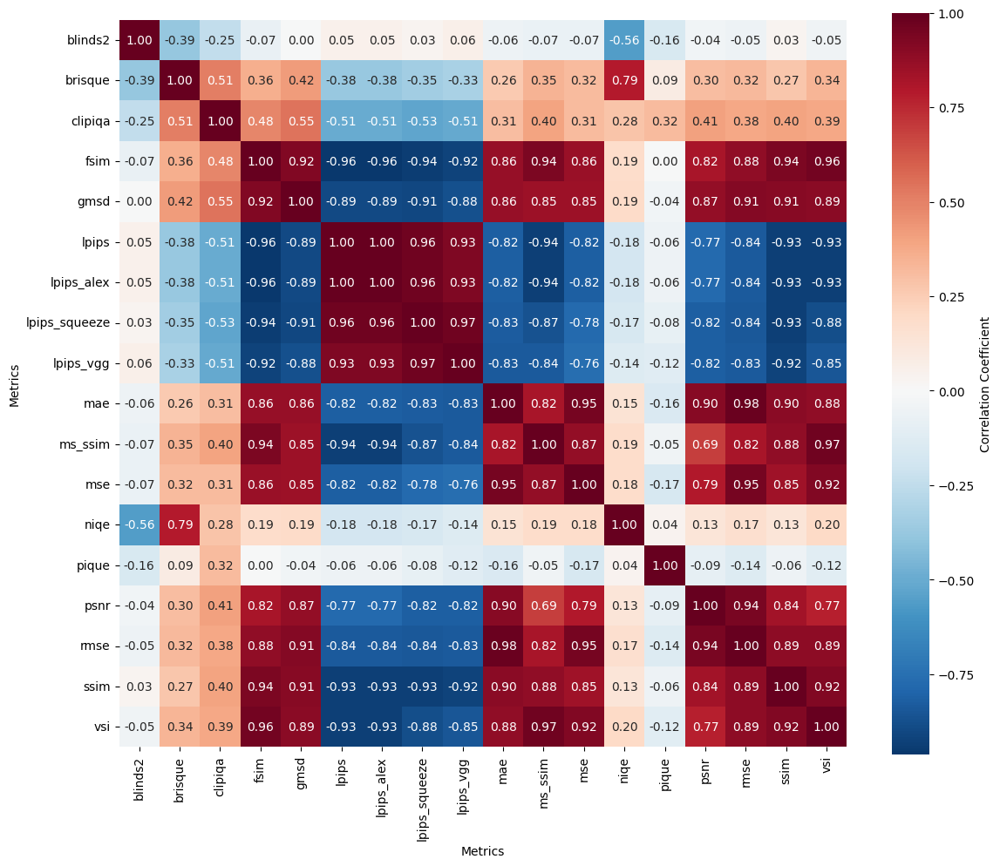

Correlation Matrix Summary:
Shape: (18, 18)
Average correlation (excluding diagonal): 0.062

Highly correlated metric pairs (|r| > 0.8):
  fsim - gmsd: 0.920
  fsim - lpips: -0.962
  fsim - lpips_alex: -0.962
  fsim - lpips_squeeze: -0.941
  fsim - lpips_vgg: -0.918
  fsim - mae: 0.862
  fsim - ms_ssim: 0.937
  fsim - mse: 0.862
  fsim - psnr: 0.816
  fsim - rmse: 0.884
  fsim - ssim: 0.936
  fsim - vsi: 0.956
  gmsd - lpips: -0.893
  gmsd - lpips_alex: -0.893
  gmsd - lpips_squeeze: -0.905
  gmsd - lpips_vgg: -0.876
  gmsd - mae: 0.862
  gmsd - ms_ssim: 0.851
  gmsd - mse: 0.850
  gmsd - psnr: 0.874
  gmsd - rmse: 0.912
  gmsd - ssim: 0.908
  gmsd - vsi: 0.893
  lpips - lpips_alex: 1.000
  lpips - lpips_squeeze: 0.962
  lpips - lpips_vgg: 0.931
  lpips - mae: -0.822
  lpips - ms_ssim: -0.937
  lpips - mse: -0.819
  lpips - rmse: -0.836
  lpips - ssim: -0.934
  lpips - vsi: -0.934
  lpips_alex - lpips_squeeze: 0.962
  lpips_alex - lpips_vgg: 0.931
  lpips_alex - mae: -0.822
  lpips_ale

In [79]:
# Create a simple correlation map of metrics across datasets
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    # Pivot the data to have metrics as columns
    pivot_corr = custom_df.pivot_table(index=['distorted_image_path'], columns='metric', values='score', aggfunc='mean')
    
    # Calculate correlation matrix
    corr_matrix = pivot_corr.corr()
    
    # Create the correlation heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr_matrix, annot=True, cmap='RdBu_r', center=0, 
                square=True, fmt='.2f', cbar_kws={'label': 'Correlation Coefficient'})
    # plt.title('Metric Correlation Matrix - Custom Dataset')
    plt.xlabel('Metrics')
    plt.ylabel('Metrics')
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("Correlation Matrix Summary:")
    print(f"Shape: {corr_matrix.shape}")
    print(f"Average correlation (excluding diagonal): {corr_matrix.where(~np.eye(corr_matrix.shape[0], dtype=bool)).mean().mean():.3f}")
    
    # Find highly correlated pairs (>0.8)
    high_corr_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_val = corr_matrix.iloc[i, j]
            if abs(corr_val) > 0.8:
                high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_val))
    
    if high_corr_pairs:
        print(f"\nHighly correlated metric pairs (|r| > 0.8):")
        for metric1, metric2, corr in high_corr_pairs:
            print(f"  {metric1} - {metric2}: {corr:.3f}")
    else:
        print("\nNo highly correlated metric pairs found (|r| > 0.8)")

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3738939929.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.index, y=metric_means.values, palette='viridis')


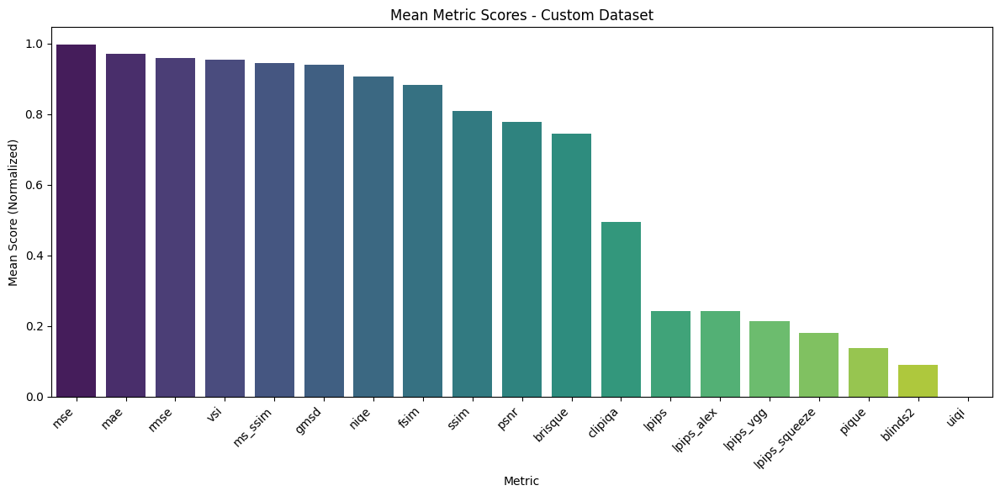

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3738939929.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')


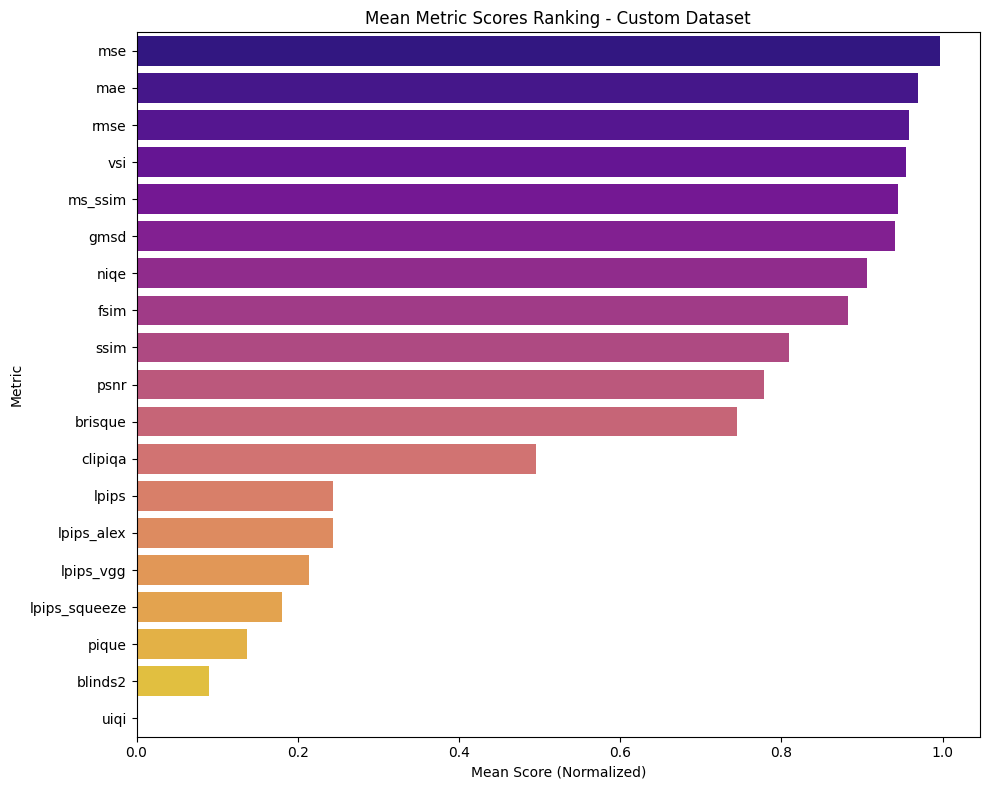

In [76]:
# Bar chart for custom dataset results
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    # Create a bar chart showing mean scores per metric
    plt.figure(figsize=(12, 6))
    metric_means = custom_df.groupby('metric')['score'].mean().sort_values(ascending=False)
    sns.barplot(x=metric_means.index, y=metric_means.values, palette='viridis')
    plt.title('Mean Metric Scores - Custom Dataset')
    plt.xlabel('Metric')
    plt.ylabel('Mean Score (Normalized)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Additional horizontal bar chart for better readability of metric names
    plt.figure(figsize=(10, 8))
    sns.barplot(x=metric_means.values, y=metric_means.index, palette='plasma')
    plt.title('Mean Metric Scores Ranking - Custom Dataset')
    plt.xlabel('Mean Score (Normalized)')
    plt.ylabel('Metric')
    plt.tight_layout()
    plt.show()

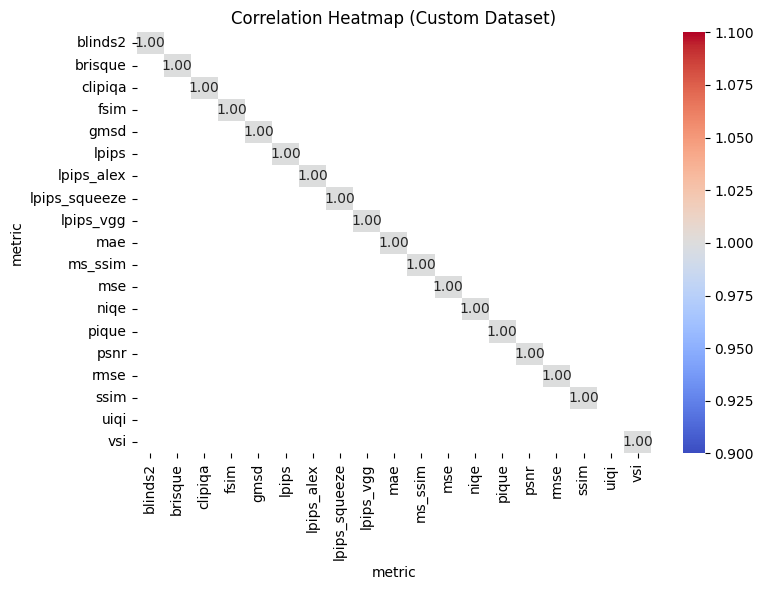

In [ ]:

# Heatmap: Custom dataset metric correlations
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    if custom_df['metric'].nunique() > 1:
        pivot = custom_df.pivot(columns='metric', values='score')
        if pivot.shape[1] > 1:
            corr = pivot.corr()
            plt.figure(figsize=(8,6))
            sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
            plt.title('Correlation Heatmap (Custom Dataset)')
            plt.tight_layout()
            plt.show()

/var/folders/kv/dhtpsyc96bxbf6h3xtp79xnc0000gn/T/ipykernel_9893/3301085425.py:5: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(custom_df[custom_df['metric']==metric]['score'], label=metric, fill=True, alpha=0.2)


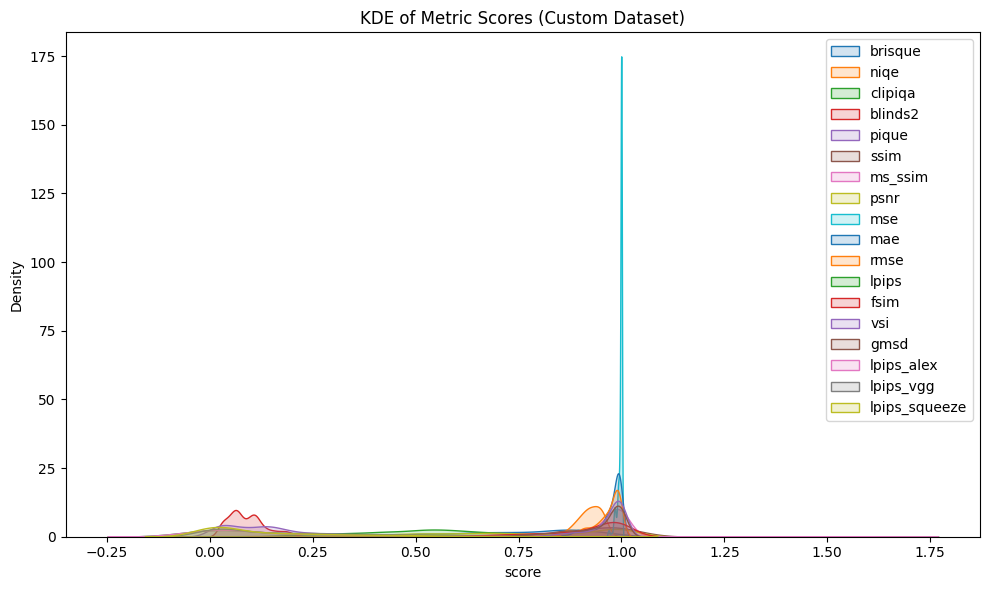

In [74]:

# KDE plot: Custom dataset
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    plt.figure(figsize=(10,6))
    for metric in custom_df['metric'].unique():
        sns.kdeplot(custom_df[custom_df['metric']==metric]['score'], label=metric, fill=True, alpha=0.2)
    plt.title('KDE of Metric Scores (Custom Dataset)')
    plt.xlabel('score')
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()

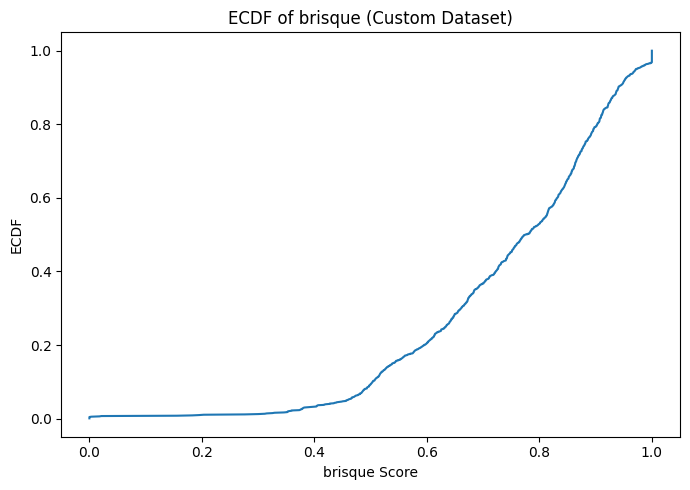

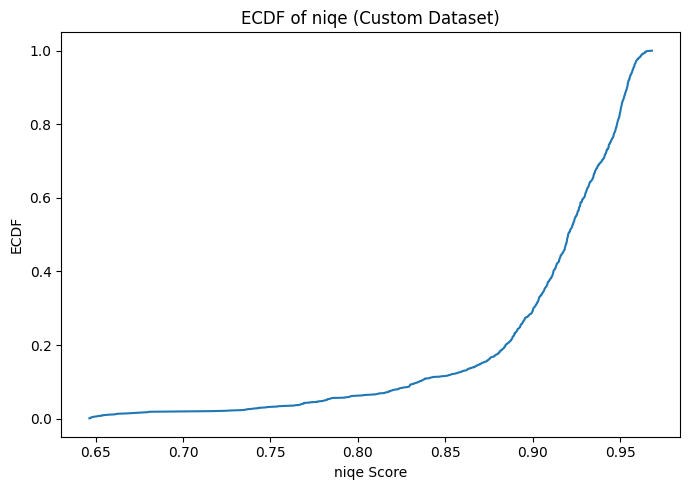

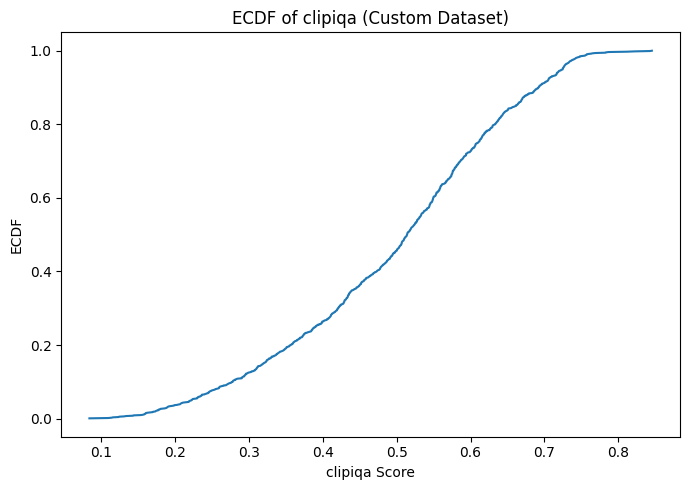

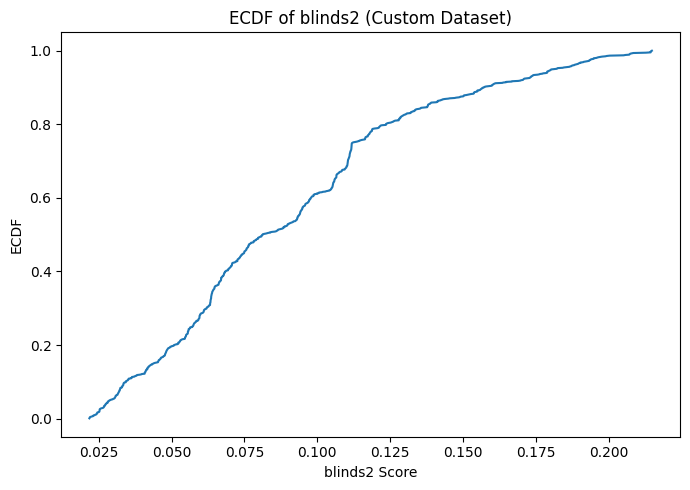

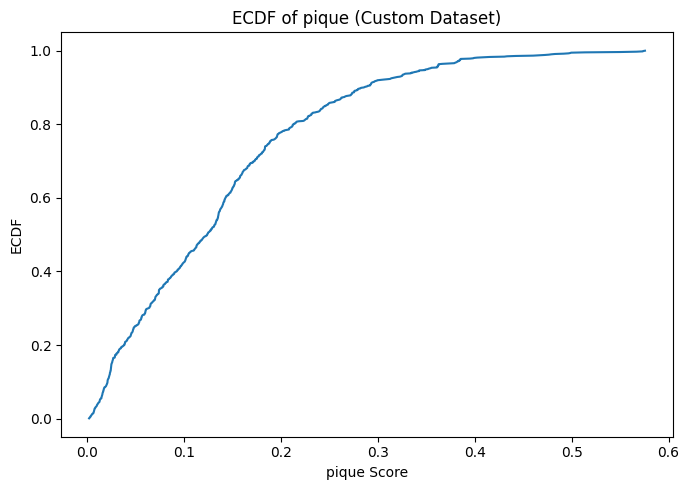

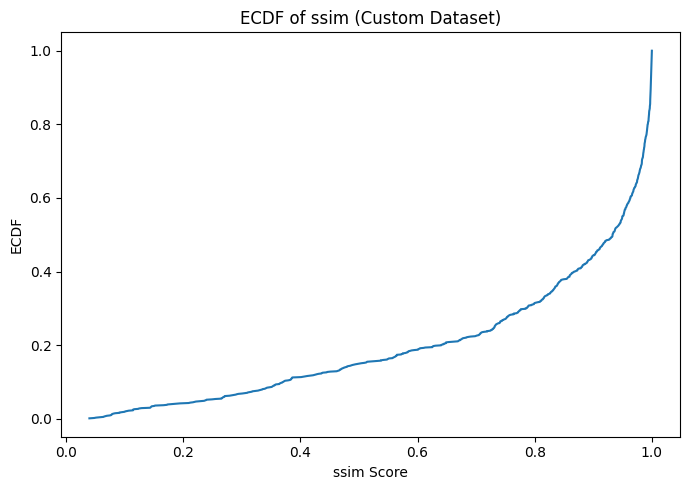

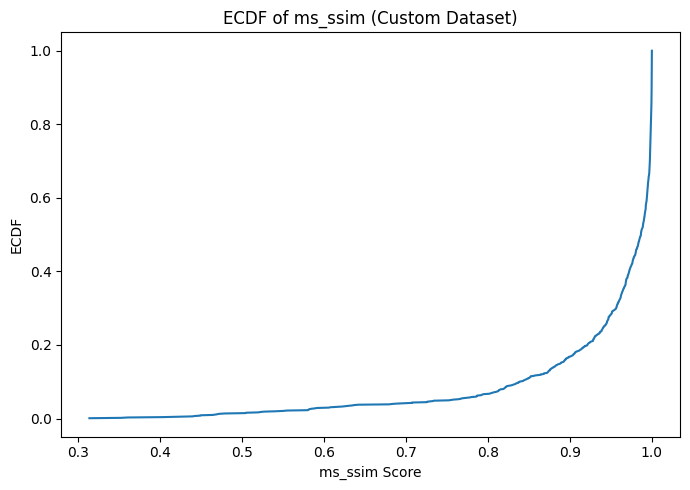

ZeroDivisionError: float division by zero

In [75]:

# ECDF: Custom dataset
if custom_df is not None and 'metric' in custom_df.columns and 'score' in custom_df.columns:
    from statsmodels.distributions.empirical_distribution import ECDF
    for metric in custom_df['metric'].unique():
        ecdf = ECDF(custom_df[custom_df['metric']==metric]['score'].dropna())
        plt.figure(figsize=(7,5))
        plt.plot(ecdf.x, ecdf.y)
        plt.title(f'ECDF of {metric} (Custom Dataset)')
        plt.xlabel(f'{metric} Score')
        plt.ylabel('ECDF')
        plt.tight_layout()
        plt.show()

**Note on Metric Normalization:**

All metrics are normalized so that higher values always indicate better image quality, regardless of their original directionality. This ensures that agreement rates, correlations, and performance summaries are fair and directly comparable across all metrics. For metrics where lower is better (e.g., LPIPS, DISTS, NIQE, BRISQUE), the scores are inverted before analysis. All visualizations and rankings in this notebook use these normalized scores.

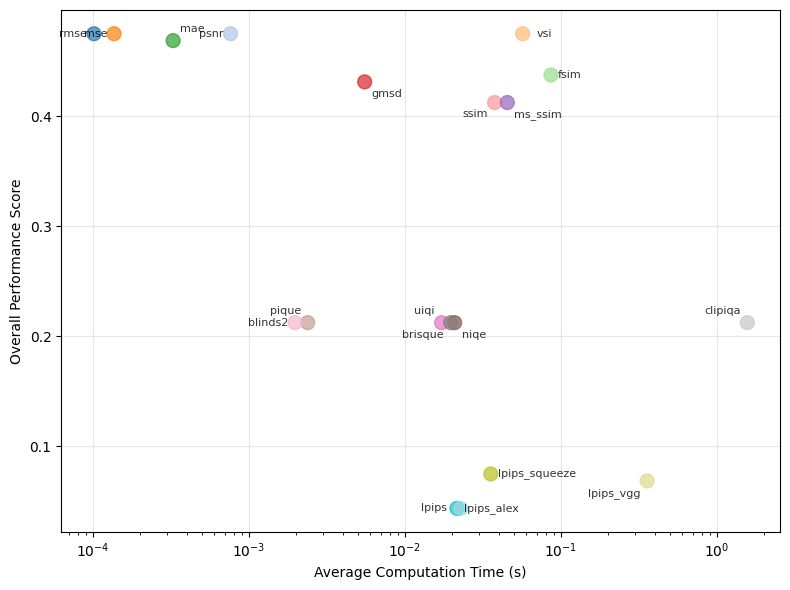


Final Performance DataFrame (excluding timing metrics):
                 Metric  BAPPS_Agreement  LIVE_MD_Pearson_Abs  \
0                  rmse           0.9500                  NaN   
1                  psnr           0.9500                  NaN   
2                   mse           0.9500                  NaN   
3                   vsi           0.9500                  NaN   
4                   mae           0.9375                  NaN   
5                  fsim           0.8750                  NaN   
6                  gmsd           0.8625                  NaN   
7       lpips_vgg_score              NaN             0.839382   
8                  ssim           0.8250                  NaN   
9               ms_ssim           0.8250                  NaN   
10           fsim_score              NaN             0.823319   
11  lpips_squeeze_score              NaN             0.815532   
12     lpips_alex_score              NaN             0.812624   
13          lpips_score          

In [31]:
import random

# A scatter plot chart focusing mainly on computation time of all the datasets, BAPPS, and LIVE-MD and custom dataset
if perf_df is not None and 'Avg_Computation_Time_s' in perf_df.columns:
    # Filter out rows where Metric ends with '_time' as these are not actual metrics
    # Also filter out rows with NaN computation times
    filtered_perf_df = perf_df[~perf_df['Metric'].str.endswith('_time') & 
                              perf_df['Avg_Computation_Time_s'].notna()]
    
    if not filtered_perf_df.empty:
        plt.figure(figsize=(8, 6))
        scatter = plt.scatter(filtered_perf_df['Avg_Computation_Time_s'], 
                             filtered_perf_df['Overall_Performance_Score'], 
                             s=100, alpha=0.7, c=range(len(filtered_perf_df)), cmap='tab20')
        
        # Add metric labels to points with varied positioning

        label_positions = ['left', 'right', 'center left', 'center right', 
                          'bottom left', 'bottom right', 'top left', 'top right']

        for i, row in filtered_perf_df.iterrows():
            # Randomly choose label position
            pos = random.choice(label_positions)
            
            # Set offset based on position
            if 'left' in pos:
                offset_x = -5 if 'center' not in pos else -10
                ha = 'right'
            elif 'right' in pos:
                offset_x = 5 if 'center' not in pos else 10
                ha = 'left'
            else:
                offset_x = 0
                ha = 'center'
            
            if 'top' in pos:
                offset_y = 5
                va = 'bottom'
            elif 'bottom' in pos:
                offset_y = -5
                va = 'top'
            else:
                offset_y = 0
                va = 'center'
            
            plt.annotate(row['Metric'], 
                         (row['Avg_Computation_Time_s'], row['Overall_Performance_Score']),
                         xytext=(offset_x, offset_y), textcoords='offset points', 
                         fontsize=8, ha=ha, va=va, alpha=0.8)
        
        # plt.title('Computation Time vs Overall Performance Score')
        plt.xlabel('Average Computation Time (s)')
        plt.ylabel('Overall Performance Score')
        plt.xscale('log')  # Log scale for better visibility
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    else:
        print("No data available with valid computation times for plotting")
# Print the final performance DataFrame (filtered to exclude timing metrics)
if perf_df is not None:
    filtered_perf_df = perf_df[~perf_df['Metric'].str.endswith('_time')]
    print("\nFinal Performance DataFrame (excluding timing metrics):")
    print(filtered_perf_df)
    print(f"\nTotal number of actual metrics evaluated: {filtered_perf_df['Metric'].nunique()}")
    print(f"Total number of categories: {filtered_perf_df['Category'].nunique()}")
    print(f"Total number of types: {filtered_perf_df['Type'].nunique()}")
